# Imports

In [1]:
import numpy as np
import torch
import torch.nn as nn
from torchvision import datasets
import torchvision.transforms.v2 as transforms
from torchvision import transforms
from torch.utils.data.sampler import SubsetRandomSampler
import torch.nn.functional as F

import torchvision.transforms.v2 as v2

from PIL import Image
import matplotlib.pyplot as plt
import itertools
import collections
from tqdm.notebook import tqdm
import pandas as pd
import random
import scipy

import scienceplots
plt.style.use("default")
plt.style.use(["science","scatter"])

# # torch.use_deterministic_algorithms(True) # TODO: Fix error when this is uncommented
# torch.backends.cudnn.deterministic = True

in_size = 16
batch_size = 64

# use_double_precision = True

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


In [39]:
use_double_precision = False

# Download and transform MNIST dataset

In [244]:
mnist = datasets.MNIST(root="./data", download=True)

transforms_list = [v2.ToTensor()]
if in_size != 28:
    transforms_list.append( v2.Resize(in_size) )
if use_double_precision:
    transforms_list.append( v2.ToDtype(torch.double) )
transform = transforms.Compose(transforms_list)

mnist_train = datasets.MNIST(root="./data", download=True, train=True, transform = transform)
mnist_test = datasets.MNIST(root="./data", download=True, train=False, transform = transform)
train_loader = torch.utils.data.DataLoader(mnist_train, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(mnist_test, batch_size=batch_size, shuffle=False)

C:\Users\Johnn\anaconda3\Lib\site-packages\torchvision\transforms\v2\_deprecated.py:41: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.
  warnings.warn(


# Helper functions for CNN setup

In [42]:
def toeplitz_1_ch(kernel, input_size):
    # shapes
    k_h, k_w = kernel.shape
    i_h, i_w = input_size
    o_h, o_w = i_h-k_h+1, i_w-k_w+1

    # construct 1d conv toeplitz matrices for each row of the kernel
    toeplitz = []
    for r in range(k_h):
        toeplitz.append(scipy.linalg.toeplitz(c=(kernel[r,0], *np.zeros(i_w-k_w)), r=(*kernel[r], *np.zeros(i_w-k_w))) )

    # construct toeplitz matrix of toeplitz matrices (just for padding=0)
    h_blocks, w_blocks = o_h, i_h
    h_block, w_block = toeplitz[0].shape

    W_conv = np.zeros((h_blocks, h_block, w_blocks, w_block))

    for i, B in enumerate(toeplitz):
        for j in range(o_h):
            W_conv[j, :, i+j, :] = B

    W_conv.shape = (h_blocks*h_block, w_blocks*w_block)

    return W_conv

# https://stackoverflow.com/questions/56702873/is-there-an-function-in-pytorch-for-converting-convolutions-to-fully-connected-n
def conv2d_toeplitz(kernel, input):
    """Compute 2d convolution over multiple channels via toeplitz matrix
    Args:
        kernel: shape=(n_out, n_in, H_k, W_k)
        input: shape=(n_in, H_i, W_i)"""

    kernel_size = kernel.shape
    input_size = input.shape
    output_size = (kernel_size[0], input_size[1] - (kernel_size[1]-1), input_size[2] - (kernel_size[2]-1))
    output = np.zeros(output_size)
    if use_double_precision:
        output = output.astype(np.float64)

    for i,ks in enumerate(kernel):  # loop over output channel
        for j,k in enumerate(ks):  # loop over input channel
            T_k = toeplitz_1_ch(k, input_size[1:])
            output[i] += T_k.dot(input[j].flatten()).reshape(output_size[1:])  # sum over input channels

    return output


def get_resampling_matrix(in_dims, out_dims):
    """
    For two 2D matrices with corresponding dimensions `in_dims` and `out_dims`,
    create a matrix M s.t. when any image of size in_dims is flattened into a vector v,
    the left-multiplication Mv gives a sampled image of size out_dims (in vector form).
    Matches the implementations of nearest neighbor interpolation in Pillow, scikit-image, and PyTorch.
    """
    result = np.zeros([np.prod(out_dims), np.prod(in_dims)], dtype=np.uint8) # Transformation matrix
    scale_factor_x = (in_dims[0]) / (out_dims[0])
    scale_factor_y = (in_dims[1]) / (out_dims[1])
    for out_coord in range(np.prod(out_dims)):

        # (x,y)-coordinates of pixel in output matrix.
        out_x = out_coord // (out_dims[1])
        out_y = out_coord % (out_dims[1])

        # Coordinates of corresponding nearest neighbor in input matrix.
        # Coordinates need to be rounded individually before we convert it back to 1D in the next step
        # We need to add +0.5 to center each pixel: https://qiita.com/yoya/items/7146d1cd12d41aecce84
        in_x = int((out_x+0.5) * scale_factor_x)
        in_y = int((out_y+0.5) * scale_factor_y)

        # Transformation matrix maps flattened coordinates corresponding to [out_x,out_y]
        # to the flattened coordinates corresponding to [in_x, in_y]
        in_coord = int(in_x*in_dims[1] + in_y)
        result[out_coord, in_coord] = 1
    return result

def cnn_to_matrices(cnn, in_size):

    W = np.eye(np.prod(in_size)) # Identity matrix with size equal to total number of input pixels (multiplicative identity)
    B = np.zeros(in_size) # Zeros (additive identity)

    if use_double_precision:
        W = W.astype(np.float64)
        B = B.astype(np.float64)

    # TODO: Multiple channels

    with torch.no_grad():

        # Convolutional layer(s)
        for conv in cnn.convs:

            kernel = conv[0].weight.detach().cpu()
            kernel = kernel[0][0]
            layer_weight = toeplitz_1_ch(kernel, in_size)
            layer_bias = conv[0].bias.item()

            B = layer_weight @ B.ravel() + layer_bias
            W = layer_weight @ W

            in_size -= (np.asarray(kernel.shape) - 1) # No padding was used (TODO: Include padding?)

        W_latent = W.copy() # Latent representation (i.e. has not gone through final layer yet)
        B_latent = B.copy() # Latent representation

        # Fully connected layer
        fc = cnn.fc.weight.detach().cpu()
        B = fc @ B + cnn.fc.bias.detach().cpu()
        W = fc @ W

    return W, B, W_latent, B_latent
    

def homcnn_to_matrices(homcnn):

    in_size = np.asarray([homcnn.in_size, homcnn.in_size])
    t = homcnn.t

    W = np.eye(np.prod(in_size)) # Identity matrix with size equal to total number of input pixels (multiplicative identity)
    B = np.zeros(in_size) # Zeros (additive identity)

    if use_double_precision:
        W = W.astype(np.float64)
        B = B.astype(np.float64)

    # TODO: Multiple channels

    # Record of values of W and B as inputs move throughout network
    W_previous = []
    B_previous = []

    with torch.no_grad():

        # Convolutional layer(s)
        for i, conn_list in homcnn.layer_iterator:

            conv = homcnn.convs[i]
            kernel = conv[0].weight.detach().cpu()
            kernel = kernel[0][0]
            layer_weight = toeplitz_1_ch(kernel, in_size)
            layer_bias = conv[0].bias.item()

            # Feed-forward connections
            B = layer_weight @ B.ravel() + layer_bias
            W = layer_weight @ W

            # Skip connections
            if len(conn_list) > 0:
                residual_weight = (1-t) / len(conn_list)
                W = t*W
                B = t*B
                for j in conn_list: # Indices of layers that have a skip connection ending at current layer
                    resampling_matrix = get_resampling_matrix([homcnn.layer_img_dims[j],homcnn.layer_img_dims[j]],[homcnn.layer_img_dims[i],homcnn.layer_img_dims[i]])
                    W += residual_weight*(resampling_matrix @ W_previous[j])
                    B += residual_weight*(B_previous[j][0])

            W_previous.append(W.copy())
            B_previous.append(B.copy())

            in_size -= (np.asarray(kernel.shape) - 1) # No padding was used (TODO: Include padding?)

        # Latent representations (i.e. have not gone through final layer yet)
        W_latent = W.copy()
        B_latent = B.copy()

        # Fully connected layer
        fc = homcnn.fc.weight.detach().cpu()
        B = fc @ B + homcnn.fc.bias.detach().cpu()
        W = fc @ W

    return W, B, W_latent, B_latent

# CNN setup

In [183]:
class BasicCNN(nn.Module):
    """
    Convolutional neural network with no skip connections
    """

    def __init__(self, in_channels, out_channels, t=0.5, n_classes=10, n_layers=3, connections="all", stride = 1, in_size=28, kernel_size=3):

        super(BasicCNN, self).__init__()

        self.in_channels = in_channels
        self.out_channels = out_channels
        self.n_layers = n_layers
        self.t = t

        if hasattr(kernel_size, "__len__"): # Kernel size list should override n_layers
            n_layers = len(kernel_size)

        if isinstance(kernel_size, int): # Kernel size can either be int, or list of ints. If int, convert to list of ints
            kernel_size = kernel_size * np.ones(n_layers, dtype=int)
        else:
            kernel_size = np.asarray(kernel_size)
        self.kernel_size = kernel_size

        in_out = [(in_channels, out_channels)] + [(out_channels,out_channels) for _ in range(n_layers-1)]
        self.convs = nn.ModuleList([
            nn.Sequential(
                nn.Conv2d(in_out[i][0], in_out[i][1], kernel_size=kernel_size[i], stride=stride, padding=0, bias=True),
                # nn.BatchNorm2d(out_channels),
                # nn.LeakyReLU(0.1)
            )
            for i in range(n_layers)
        ])

        fc_size = (in_size-np.sum(kernel_size-1))**2
        self.fc = nn.Linear(fc_size, n_classes)

    # @torch.jit.trace
    def forward(self, x):
        out = x
        for i in range(self.n_layers):
            out = self.convs[i](out)
        # out = out + F.resize(x,19)
        # out = self.convs[-1](out)

        out = out.view(out.size(0), -1)
        out = self.fc(out)
        # out = torch.nn.functional.softmax(out)
        return out

class HomotopyCNN(nn.Module):
    """
    Convolutional neural network with skip connections
    """

    def __init__(self, in_channels, out_channels, t=0.5, n_classes=10, n_layers=3, connections="all", stride = 1, in_size=28, kernel_size=3, 
                 padding=0, activation=nn.Identity(), channel_list = None):

        super(HomotopyCNN, self).__init__()

        if hasattr(kernel_size, "__len__"): # Kernel size list should override n_layers
            n_layers = len(kernel_size)

        self.in_channels = in_channels
        self.out_channels = out_channels
        self.n_layers = n_layers
        self.t = t
        self.in_size = in_size
        self.padding = padding

        if isinstance(connections, str):
            connections = connections.casefold()
        if connections == "all":
            connections = list(itertools.combinations(range(n_layers), r=2))
            connections = [c for c in connections if c[0]+1 != c[1]] # Remove connections from current layer to subsequent layer (redundant)
        # For each entry v in layer_iterator, v[0] is the layer index and v[1] is a list containing all
        # previous layers that have a skip connection to layer v[0].
        elif connections == "none" or connections is None:
            connections = []
        self.layer_iterator = [(i, [x[0] for x in connections if x[1]==i]) for i in range(n_layers)]

        if isinstance(kernel_size, int): # Kernel size can either be int, or list of ints. If int, convert to list of ints
            kernel_size = kernel_size * np.ones(n_layers, dtype=int)
        else:
            kernel_size = np.asarray(kernel_size)
        self.kernel_size = kernel_size

        # if channel_list is None:
        #     in_out = [(in_channels, out_channels)] + [(out_channels,out_channels) for _ in range(n_layers-1)]
        # else:
        #     in_out = [in_channels,channel_list[0]] + [[channel_list[i-1]] for i, c in enumerate(channel_list)] + [channel_list[-1],out_channels]
        in_out = [(in_channels, out_channels)] + [(out_channels,out_channels) for _ in range(n_layers-1)]
        
        self.convs = nn.ModuleList([
            nn.Sequential(
                # pad_layer(kernel_size[i]),
                nn.Conv2d(in_out[i][0], in_out[i][1], kernel_size=kernel_size[i], stride=stride, padding=padding, bias=True),
                nn.BatchNorm2d(out_channels),
                activation,
            )
            for i in range(n_layers)
        ])

        # Dimensions of image after each layer has been applied
        if padding == "same":
            self.layer_img_dims = [in_size for _ in range(len(kernel_size))]
        else: 
            self.layer_img_dims = np.cumsum([in_size]+[-s+1 for s in kernel_size])[1:]

        # Fully-connected layer
        fc_size = self.layer_img_dims[-1]**2
        self.fc = nn.Linear(fc_size*out_channels, n_classes)

    # @torch.jit.trace
    def forward(self, x):
        out = x
        residuals = []
        for i, conn_list in self.layer_iterator:
            out = self.convs[i](out)
            if len(conn_list) > 0:
                residual_weight = (1-self.t)/len(conn_list)
                out = self.t * out # Feed-forward input gets weight t, all other inputs get weight (1-t)/n, where n is number of skip connections
                for j in conn_list:
                    out = out + residual_weight * F.interpolate(residuals[j], size=self.layer_img_dims[i], mode="nearest-exact")
            residuals.append(out)

        out = out.view(out.size(0), -1)
        out = self.fc(out)
        return out


# ResNet source code (lightly modified)

In [306]:
from functools import partial
from typing import Any, Callable, List, Optional, Type, Union

import torch
import torch.nn as nn
from torch import Tensor

def conv3x3(in_planes: int, out_planes: int, stride: int = 1, groups: int = 1, dilation: int = 1) -> nn.Conv2d:
    """3x3 convolution with padding"""
    return nn.Conv2d(
        in_planes,
        out_planes,
        kernel_size=3,
        stride=stride,
        padding=dilation,
        groups=groups,
        bias=False,
        dilation=dilation,
    )


def conv1x1(in_planes: int, out_planes: int, stride: int = 1) -> nn.Conv2d:
    """1x1 convolution"""
    return nn.Conv2d(in_planes, out_planes, kernel_size=1, stride=stride, bias=False)


class BasicBlock(nn.Module):
    expansion: int = 1

    def __init__(
        self,
        t: int,
        inplanes: int,
        planes: int,
        stride: int = 1,
        downsample: Optional[nn.Module] = None,
        groups: int = 1,
        base_width: int = 64,
        dilation: int = 1,
        norm_layer: Optional[Callable[..., nn.Module]] = None,
        linear = False
    ) -> None:
        super().__init__()
        if norm_layer is None:
            norm_layer = nn.BatchNorm2d
        if groups != 1 or base_width != 64:
            raise ValueError("BasicBlock only supports groups=1 and base_width=64")
        if dilation > 1:
            raise NotImplementedError("Dilation > 1 not supported in BasicBlock")
        # Both self.conv1 and self.downsample layers downsample the input when stride != 1
        self.conv1 = conv3x3(inplanes, planes, stride)
        self.bn1 = norm_layer(planes)
        self.linear = linear
        if linear:
            self.relu = nn.Identity()
        else:
            self.relu = nn.ReLU(inplace=True)
        self.conv2 = conv3x3(planes, planes)
        self.bn2 = norm_layer(planes)
        self.downsample = downsample
        self.stride = stride
        self.t = t

    def forward(self, x: Tensor) -> Tensor:
        identity = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)

        if self.downsample is not None:
            identity = self.downsample(x)

        out = (1-self.t) * out + self.t * identity
        out = self.relu(out)

        return out

    def update_t(self, new_t):
        self.t = new_t


class BasicBlockNoSkip(BasicBlock):
    """
    Basic block with skip connection removed
    """
    def forward(self, x: Tensor) -> Tensor:
        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)
        out = self.conv2(out)
        out = self.bn2(out)
        out = self.relu(out)
        return out


class Bottleneck(nn.Module):
    # Bottleneck in torchvision places the stride for downsampling at 3x3 convolution(self.conv2)
    # while original implementation places the stride at the first 1x1 convolution(self.conv1)
    # according to "Deep residual learning for image recognition" https://arxiv.org/abs/1512.03385.
    # This variant is also known as ResNet V1.5 and improves accuracy according to
    # https://ngc.nvidia.com/catalog/model-scripts/nvidia:resnet_50_v1_5_for_pytorch.

    expansion: int = 4

    def __init__(
        self,
        t: int,
        inplanes: int,
        planes: int,
        stride: int = 1,
        downsample: Optional[nn.Module] = None,
        groups: int = 1,
        base_width: int = 64,
        dilation: int = 1,
        norm_layer: Optional[Callable[..., nn.Module]] = None,
        linear = False
    ) -> None:
        super().__init__()
        if norm_layer is None:
            norm_layer = nn.BatchNorm2d
        width = int(planes * (base_width / 64.0)) * groups
        # Both self.conv2 and self.downsample layers downsample the input when stride != 1
        self.conv1 = conv1x1(inplanes, width)
        self.bn1 = norm_layer(width)
        self.conv2 = conv3x3(width, width, stride, groups, dilation)
        self.bn2 = norm_layer(width)
        self.conv3 = conv1x1(width, planes * self.expansion)
        self.bn3 = norm_layer(planes * self.expansion)
        self.linear = linear
        if linear:
            self.relu = nn.Identity()
        else:
            self.relu = nn.ReLU(inplace=True)
        self.downsample = downsample
        self.stride = stride
        self.t = t

    def forward(self, x: Tensor) -> Tensor:
        identity = x

        out = self.conv1(x)
        out = self.bn1(out)
        out = self.relu(out)

        out = self.conv2(out)
        out = self.bn2(out)
        out = self.relu(out)

        out = self.conv3(out)
        out = self.bn3(out)

        if self.downsample is not None:
            identity = self.downsample(x)

        out+= (1-self.t) * out + self.t * identity
        out = self.relu(out)

        return out

    def update_t(self, new_t):
        self.t = new_t


class ResNet(nn.Module):
    def __init__(
        self,
        t: int,
        block: Type[Union[BasicBlock, Bottleneck]],
        layers: List[int],
        num_classes: int = 10,
        zero_init_residual: bool = False,
        groups: int = 1,
        width_per_group: int = 64,
        replace_stride_with_dilation: Optional[List[bool]] = None,
        norm_layer: Optional[Callable[..., nn.Module]] = None,
        in_channels = 3,
        linear = False
    ) -> None:
        """
        New arguments that were not present in orginial ResNet:
            t :     int - strength of skip connections. Can be updated with self.update.t()
            linear: bool, default False - if True, removes all ReLU layers.
        """
        super().__init__()
        # _log_api_usage_once(self)
        if norm_layer is None:
            norm_layer = nn.BatchNorm2d
        self._norm_layer = norm_layer

        self.inplanes = 64
        self.dilation = 1
        if replace_stride_with_dilation is None:
            # each element in the tuple indicates if we should replace
            # the 2x2 stride with a dilated convolution instead
            replace_stride_with_dilation = [False, False, False]
        if len(replace_stride_with_dilation) != 3:
            raise ValueError(
                "replace_stride_with_dilation should be None "
                f"or a 3-element tuple, got {replace_stride_with_dilation}"
            )
        self.t = t
        self.groups = groups
        self.base_width = width_per_group
        self.conv1 = nn.Conv2d(in_channels, self.inplanes, kernel_size=7, stride=2, padding=3, bias=False)
        self.bn1 = norm_layer(self.inplanes)
        
        self.linear = linear
        if linear:
            self.relu = nn.Identity()
        else:
            self.relu = nn.ReLU(inplace=True)
            
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        self.layer1 = self._make_layer(self.t, block, 64, layers[0])
        self.layer2 = self._make_layer(self.t, block, 128, layers[1], stride=2, dilate=replace_stride_with_dilation[0], linear=linear)
        self.layer3 = self._make_layer(self.t, block, 256, layers[2], stride=2, dilate=replace_stride_with_dilation[1], linear=linear)
        self.layer4 = self._make_layer(self.t, block, 512, layers[3], stride=2, dilate=replace_stride_with_dilation[2], linear=linear)
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc = nn.Linear(512 * block.expansion, num_classes)

        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode="fan_out", nonlinearity="relu")
            elif isinstance(m, (nn.BatchNorm2d, nn.GroupNorm)):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)

        # Zero-initialize the last BN in each residual branch,
        # so that the residual branch starts with zeros, and each residual block behaves like an identity.
        # This improves the model by 0.2~0.3% according to https://arxiv.org/abs/1706.02677
        if zero_init_residual:
            for m in self.modules():
                if isinstance(m, Bottleneck) and m.bn3.weight is not None:
                    nn.init.constant_(m.bn3.weight, 0)  # type: ignore[arg-type]
                elif isinstance(m, BasicBlock) and m.bn2.weight is not None:
                    nn.init.constant_(m.bn2.weight, 0)  # type: ignore[arg-type]

    def _make_layer(
        self,
        t: int,
        block: Type[Union[BasicBlock, Bottleneck]],
        planes: int,
        blocks: int,
        stride: int = 1,
        dilate: bool = False,
        linear = False,
    ) -> nn.Sequential:
        norm_layer = self._norm_layer
        downsample = None
        previous_dilation = self.dilation
        if dilate:
            self.dilation *= stride
            stride = 1
        if stride != 1 or self.inplanes != planes * block.expansion:
            downsample = nn.Sequential(
                conv1x1(self.inplanes, planes * block.expansion, stride),
                norm_layer(planes * block.expansion),
            )

        layers = []
        layers.append(
            block(
                t, self.inplanes, planes, stride, downsample, self.groups, self.base_width, previous_dilation, norm_layer, linear
            )
        )
        self.inplanes = planes * block.expansion
        for _ in range(1, blocks):
            layers.append(
                block(
                    t,
                    self.inplanes,
                    planes,
                    groups=self.groups,
                    base_width=self.base_width,
                    dilation=self.dilation,
                    norm_layer=norm_layer,
                )
            )

        return nn.Sequential(*layers)

    def _forward_impl(self, x: Tensor) -> Tensor:
        # See note [TorchScript super()]
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)

        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)

        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.fc(x)

        return x

    def forward(self, x: Tensor) -> Tensor:
        return self._forward_impl(x)


    def update_t(self, new_t):
        self.t = new_t
        for layer in [self.layer1, self.layer2, self.layer3, self.layer4]:
            for block in layer:
                block.update_t(new_t)


def _resnet(
    block: Type[Union[BasicBlock, Bottleneck]],
    layers: List[int],
    weights: Optional,
    progress: bool,
    **kwargs: Any,
) -> ResNet:
    if weights is not None:
        _ovewrite_named_param(kwargs, "num_classes", len(weights.meta["categories"]))

    model = ResNet(block, layers, **kwargs)

    if weights is not None:
        model.load_state_dict(weights.get_state_dict(progress=progress, check_hash=True))

    return model

# Plots to find initial value for $t$

t values:   0%|          | 0/51 [00:00<?, ?it/s]

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

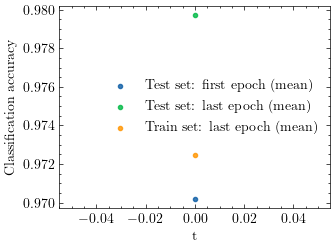

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

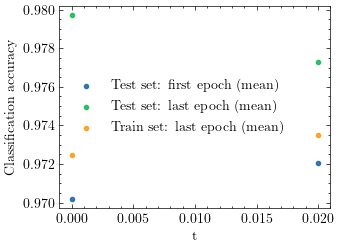

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

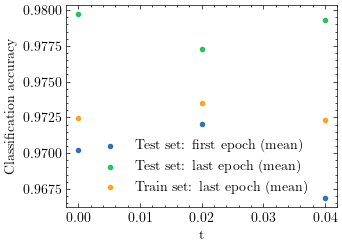

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

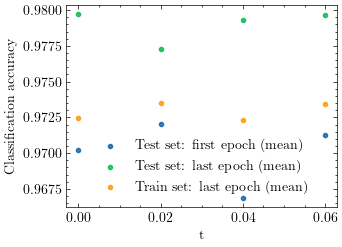

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

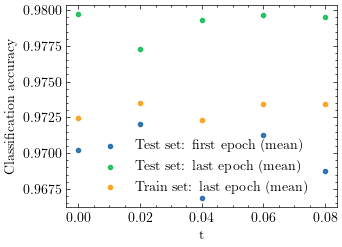

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

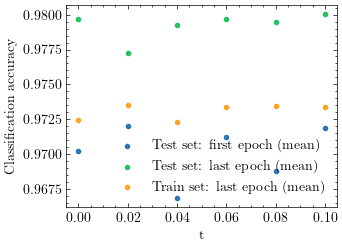

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

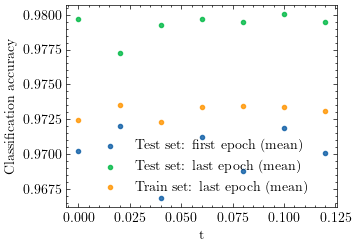

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

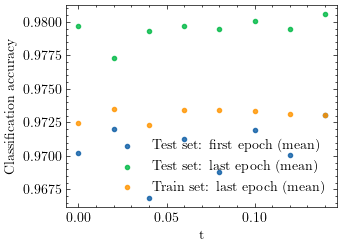

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

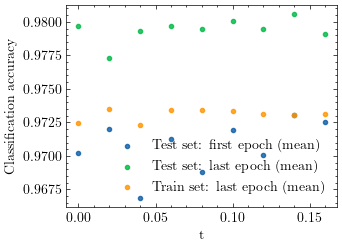

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

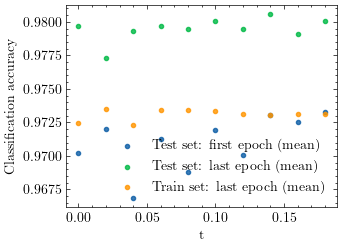

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

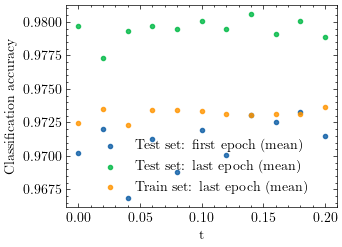

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

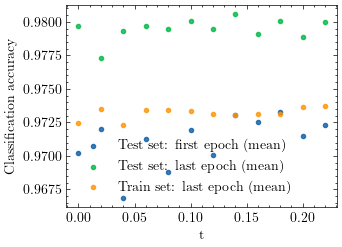

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

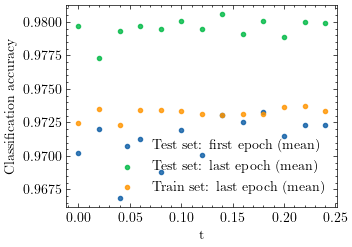

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

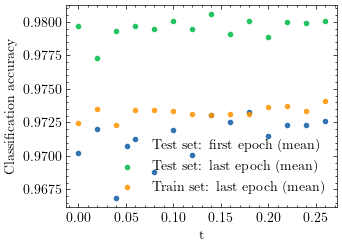

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

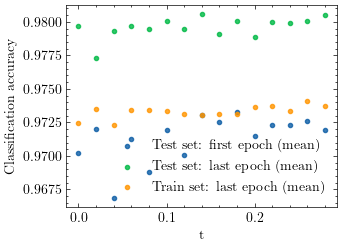

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

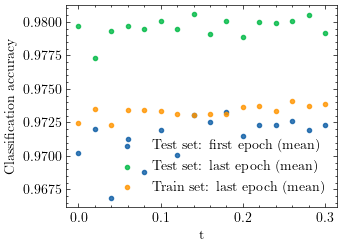

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

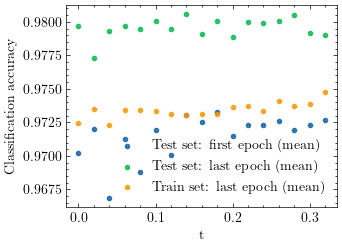

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

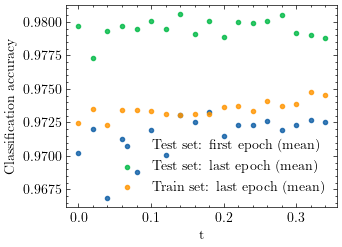

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

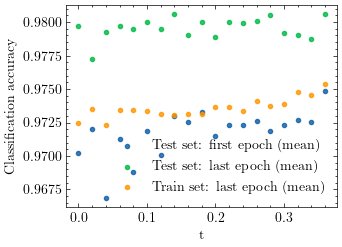

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

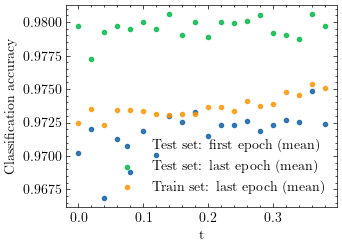

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

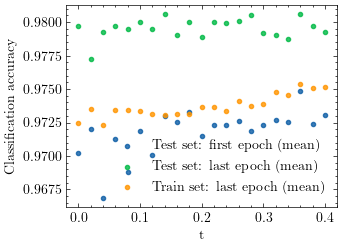

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

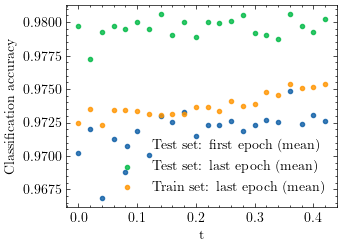

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

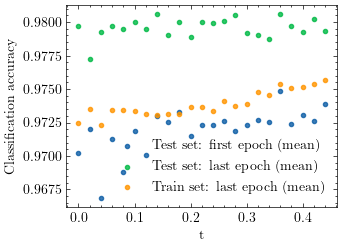

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

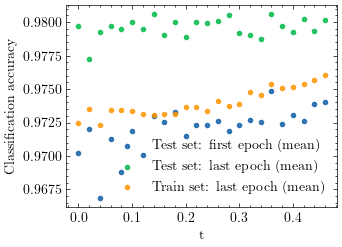

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

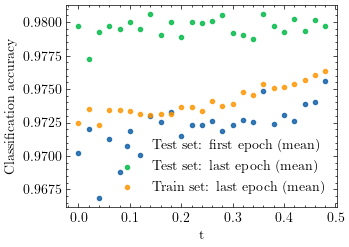

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

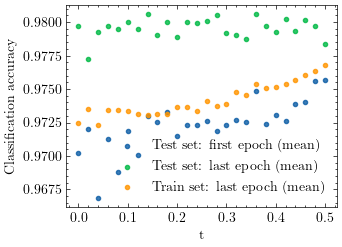

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

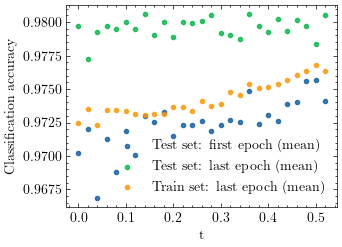

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

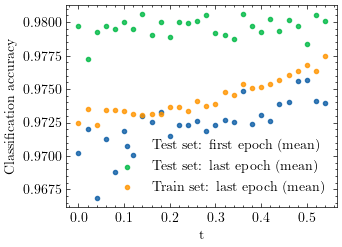

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

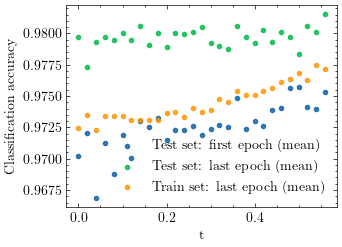

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

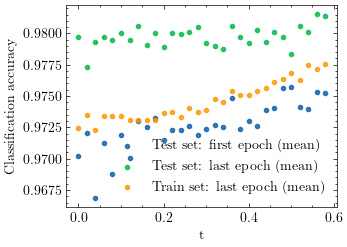

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

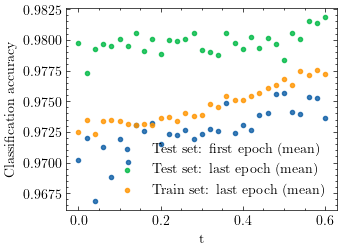

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

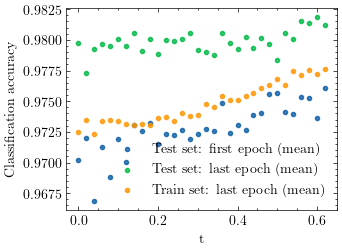

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

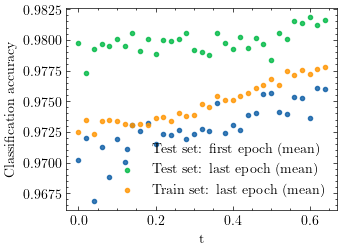

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

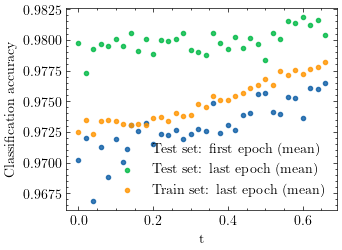

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

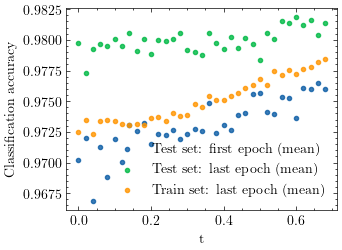

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

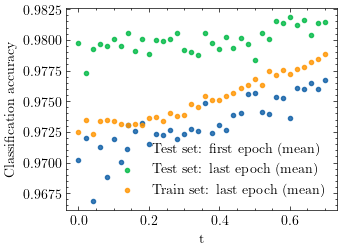

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

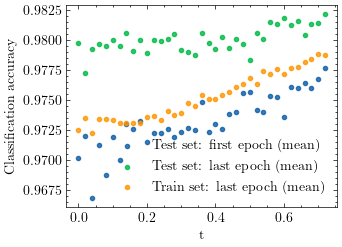

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

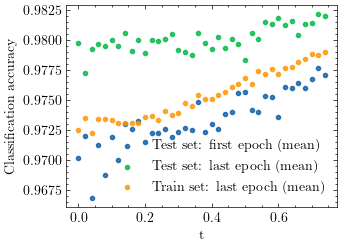

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

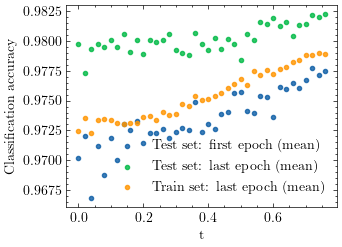

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

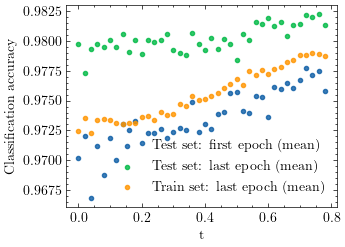

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

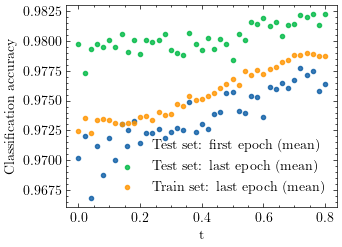

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

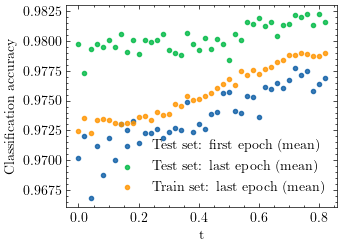

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

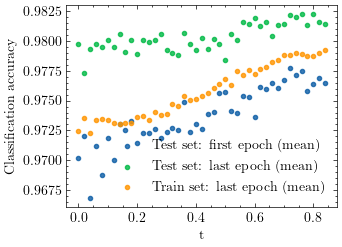

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

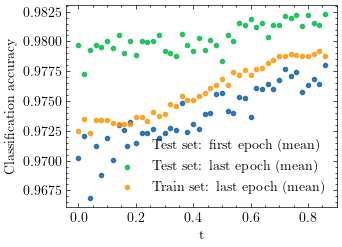

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

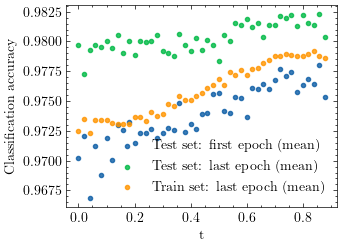

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

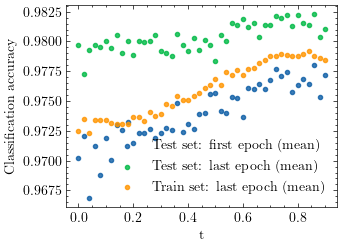

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

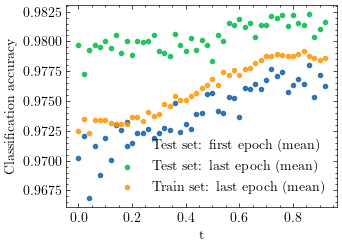

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

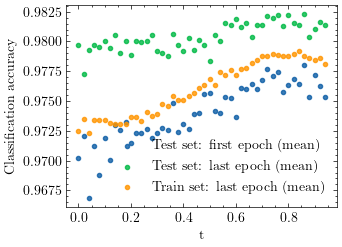

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

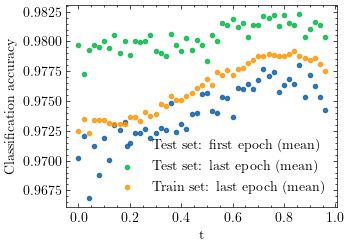

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

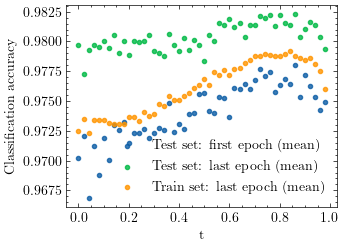

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Epochs:   0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

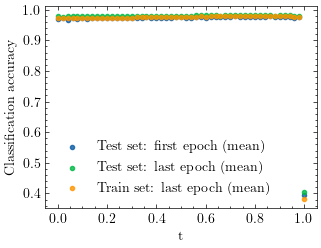

In [293]:
n_trials = 5
n_epochs = 2
loss_func = nn.CrossEntropyLoss()

results = {}
results_train = {}

t_values = np.arange(0, 1.02 ,0.02) # [0.985, 0.99, 0.995] were also used for the case of ResNet34.
t_values = t_values[~np.isin(t_values, list(results.keys()))]

for t_idx, t in tqdm(enumerate(t_values), total=len(t_values), desc="t values"):

    test_acc_list = []
    train_acc_list = []

    for trial in tqdm(range(n_trials), leave=False, desc="Trials"):

        # homcnn = HomotopyCNN(in_channels = 1, out_channels = 1, n_layers = 4, kernel_size=[3,3,3,3], in_size = in_size, connections="all", t=t).to(device)
        homcnn = ResNet(t, BasicBlock, [2, 2, 2, 2], in_channels=1).to(device) # ResNet18
        # homcnn = ResNet(t, Bottleneck, [3, 4, 6, 3], in_channels=1).to(device) # ResNet50
        # homcnn = ResNet(t, BasicBlock, [4, 4, 4, 4], in_channels=1).to(device) # ResNet18 (modified)
        # homcnn = ResNet(t, BasicBlock, [3, 4, 6, 3], in_channels=1).to(device) # ResNet34
        if use_double_precision:
            homcnn = homcnn.double()
        optim = torch.optim.SGD(homcnn.parameters(), lr=0.01, momentum=0.7)

        accuracy_over_time = []
        train_accuracy_over_time = []

        for epoch in tqdm(range(n_epochs),desc="Epochs", leave=False):
            epoch_loss = 0
            correct, total = 0, 0
            for i, (imgs, labels) in enumerate(tqdm(train_loader, leave=False, colour="purple", mininterval=0.5)):
                # imgs = 2*imgs - 1 # TODO: remove?
                imgs = imgs.to(device)
                labels_cpu = labels
                labels = labels.to(device)

                predictions = homcnn(imgs)
                loss = loss_func(predictions, labels)

                optim.zero_grad()
                loss.backward()
                optim.step()
                epoch_loss += loss.item()
                with torch.no_grad():
                    correct += sum(np.argmax(predictions.to("cpu"), axis=1) == labels_cpu).item()
                    total += len(labels)
                
            if epoch == n_epochs - 1:
                train_accuracy_over_time.append(correct/total)

            with torch.no_grad():
                correct, total = 0, 0
                for imgs, labels in tqdm(test_loader, desc="Validation", leave=False, colour="gray", mininterval=0.5):
                    # imgs = 2*imgs - 1 # TODO: remove?
                    imgs = imgs.to(device)
                    predictions = homcnn(imgs)
                    predictions = np.argmax(predictions.to("cpu"), axis=1) # Turn probabilities into prediction by taking highest logit
                    correct += sum(predictions == labels).item()
                    total += len(labels)
                accuracy = correct/total
                accuracy_over_time.append(accuracy)
                # print(f"Validation accuracy:  {accuracy:.5f} ({correct}/{total})")

        test_acc_list.append(accuracy_over_time)
        train_acc_list.append(train_accuracy_over_time)

    results[t] = test_acc_list
    results_train[t] = train_acc_list

    avg_first_epoch = [np.mean([sublist[0] for sublist in v]) for k, v in results.items()]
    avg_last_epoch = [np.mean([sublist[-1] for sublist in v]) for k, v in results.items()]
    train_avg = [np.mean(v) for k, v in results_train.items()]
    fig, ax = plt.subplots()
    ax.scatter(results.keys(), avg_first_epoch, alpha=0.8, label="Test set: first epoch (mean)")
    ax.scatter(results.keys(), avg_last_epoch, alpha=0.8, label="Test set: last epoch (mean)")
    ax.scatter(results_train.keys(), train_avg, alpha=0.8, label="Train set: last epoch (mean)")
    ax.set_xlabel("t")
    ax.set_ylabel("Classification accuracy")
    ax.legend()
    plt.show()

    if t_idx+1 % 2 == 0:
        print(results)

        # W, B, W_latent, B_latent = homcnn_to_matrices(homcnn)
        # filename = "2024-03-27-convolution_arrays_cnn_no_skips.npz"
        # np.savez(filename, W=W.numpy(), B=B.numpy(), W_latent=W_latent, B_latent=B_latent)


## Plot results

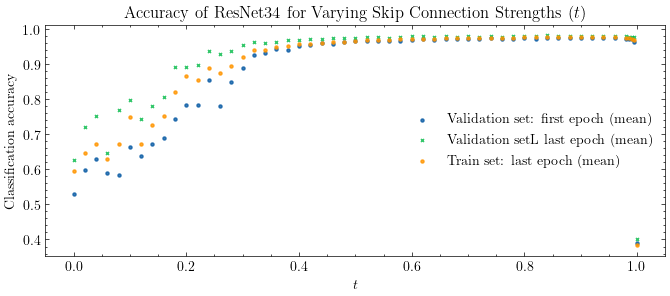

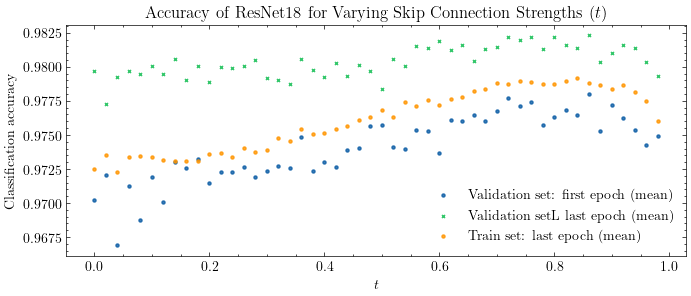

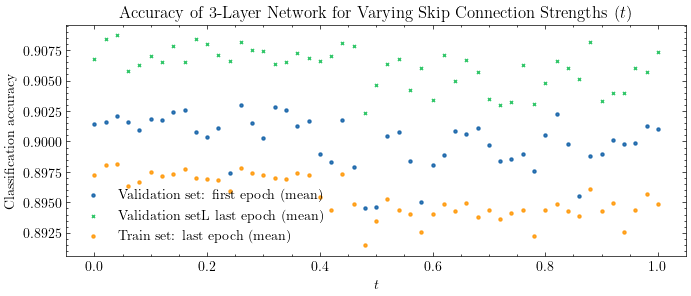

In [302]:
# Results for ResNet18
# results = {0.0: [[0.9712, 0.9798], [0.9692, 0.9809], [0.9691, 0.9784], [0.9706, 0.9778], [0.9709, 0.9817]], 0.02: [[0.9742, 0.9705], [0.9726, 0.9796], [0.9682, 0.9768], [0.9734, 0.9826], [0.9718, 0.9769]], 0.04: [[0.9725, 0.9817], [0.9695, 0.981], [0.9624, 0.9772], [0.9628, 0.9776], [0.9672, 0.9789]], 0.06: [[0.9632, 0.9807], [0.9717, 0.9789], [0.9717, 0.9783], [0.9751, 0.979], [0.9745, 0.9815]], 0.08: [[0.9675, 0.977], [0.9675, 0.9813], [0.9688, 0.9789], [0.9658, 0.9815], [0.9743, 0.9788]], 0.1: [[0.9739, 0.9791], [0.9683, 0.9803], [0.9712, 0.9815], [0.9715, 0.9813], [0.9746, 0.978]], 0.12: [[0.9692, 0.978], [0.9681, 0.9803], [0.9738, 0.978], [0.9706, 0.9798], [0.9686, 0.9813]], 0.14: [[0.972, 0.9811], [0.9726, 0.9814], [0.974, 0.9805], [0.9745, 0.98], [0.972, 0.9799]], 0.16: [[0.9733, 0.979], [0.9754, 0.9756], [0.9688, 0.9818], [0.9726, 0.9798], [0.9727, 0.9791]], 0.18: [[0.9725, 0.9776], [0.9723, 0.9812], [0.9736, 0.9796], [0.9737, 0.9808], [0.9742, 0.981]], 0.2: [[0.972, 0.9786], [0.9732, 0.979], [0.9715, 0.9805], [0.9726, 0.9757], [0.9681, 0.9806]], 0.22: [[0.9729, 0.9783], [0.9743, 0.98], [0.9718, 0.9787], [0.9705, 0.9808], [0.972, 0.9823]], 0.24: [[0.9752, 0.9798], [0.9746, 0.9792], [0.9673, 0.9826], [0.9726, 0.9804], [0.9717, 0.9776]], 0.26: [[0.9724, 0.9826], [0.9741, 0.9781], [0.9692, 0.9801], [0.9734, 0.9808], [0.974, 0.9788]], 0.28: [[0.9727, 0.9811], [0.9756, 0.9819], [0.9713, 0.9815], [0.973, 0.9797], [0.9669, 0.9784]], 0.3: [[0.972, 0.9798], [0.9726, 0.978], [0.9727, 0.9794], [0.9726, 0.981], [0.9718, 0.9778]], 0.32: [[0.9719, 0.9806], [0.972, 0.9785], [0.9759, 0.9814], [0.9723, 0.9763], [0.9714, 0.9782]], 0.34: [[0.9713, 0.9762], [0.9734, 0.9774], [0.9695, 0.9776], [0.9751, 0.9827], [0.9734, 0.9799]], 0.36: [[0.9756, 0.982], [0.9765, 0.982], [0.9779, 0.9792], [0.9758, 0.9815], [0.9685, 0.9783]], 0.38: [[0.9731, 0.9812], [0.9723, 0.9799], [0.9729, 0.9812], [0.9705, 0.9777], [0.9731, 0.9787]], 0.4: [[0.9728, 0.9786], [0.9767, 0.9795], [0.9691, 0.9813], [0.9753, 0.9788], [0.9713, 0.978]], 0.42: [[0.973, 0.9804], [0.9723, 0.9799], [0.97, 0.9786], [0.9734, 0.9815], [0.9745, 0.9809]], 0.44: [[0.9729, 0.9843], [0.9733, 0.9808], [0.9742, 0.9721], [0.9778, 0.9797], [0.9712, 0.9797]], 0.46: [[0.9785, 0.9805], [0.9716, 0.9813], [0.9743, 0.9804], [0.9729, 0.9804], [0.9728, 0.978]], 0.48: [[0.9743, 0.9826], [0.9752, 0.9794], [0.9764, 0.9786], [0.9779, 0.9782], [0.9743, 0.9796]], 0.5: [[0.9759, 0.977], [0.9754, 0.9797], [0.9756, 0.9808], [0.9758, 0.976], [0.9758, 0.9783]], 0.52: [[0.972, 0.9797], [0.9736, 0.9825], [0.9769, 0.9803], [0.9739, 0.9801], [0.9743, 0.9802]], 0.54: [[0.9771, 0.9788], [0.9745, 0.9781], [0.9762, 0.9803], [0.9693, 0.9801], [0.9728, 0.9831]], 0.56: [[0.9752, 0.9813], [0.9761, 0.9802], [0.9775, 0.9818], [0.9712, 0.9818], [0.9767, 0.9826]], 0.58: [[0.9766, 0.9828], [0.9761, 0.9805], [0.9756, 0.9814], [0.9706, 0.9811], [0.9775, 0.981]], 0.6: [[0.9721, 0.9831], [0.9752, 0.9798], [0.9747, 0.9823], [0.973, 0.9825], [0.9732, 0.9816]], 0.62: [[0.9746, 0.9796], [0.9779, 0.9803], [0.9756, 0.9828], [0.9748, 0.9817], [0.9776, 0.9817]], 0.64: [[0.9754, 0.98], [0.9744, 0.9832], [0.9767, 0.979], [0.9785, 0.9832], [0.975, 0.9825]], 0.66: [[0.9764, 0.9835], [0.9778, 0.9792], [0.976, 0.9815], [0.975, 0.9778], [0.9771, 0.98]], 0.68: [[0.975, 0.9825], [0.9738, 0.9804], [0.9772, 0.983], [0.9768, 0.979], [0.9773, 0.9818]], 0.7000000000000001: [[0.9769, 0.9813], [0.9767, 0.9825], [0.9781, 0.9814], [0.977, 0.9819], [0.975, 0.98]], 0.72: [[0.9782, 0.9831], [0.9771, 0.9835], [0.9765, 0.9814], [0.979, 0.9823], [0.9776, 0.9805]], 0.74: [[0.977, 0.9818], [0.9774, 0.9802], [0.9785, 0.9827], [0.9762, 0.9813], [0.9764, 0.9839]], 0.76: [[0.9751, 0.9826], [0.9766, 0.9823], [0.9769, 0.9831], [0.9795, 0.9821], [0.9791, 0.981]], 0.78: [[0.9741, 0.9817], [0.979, 0.9817], [0.9769, 0.9804], [0.976, 0.9815], [0.9728, 0.9813]], 0.8: [[0.9741, 0.9831], [0.9769, 0.9826], [0.9762, 0.9814], [0.9788, 0.9809], [0.9757, 0.9831]], 0.8200000000000001: [[0.9789, 0.9811], [0.9768, 0.9811], [0.9776, 0.9818], [0.9767, 0.9814], [0.9743, 0.9825]], 0.84: [[0.9762, 0.9819], [0.9761, 0.9826], [0.974, 0.981], [0.9783, 0.9809], [0.9776, 0.9805]], 0.86: [[0.9784, 0.9819], [0.9787, 0.9823], [0.9781, 0.9826], [0.9781, 0.9829], [0.9768, 0.9818]], 0.88: [[0.9776, 0.9831], [0.974, 0.98], [0.9732, 0.9801], [0.976, 0.9798], [0.9757, 0.9788]], 0.9: [[0.9769, 0.9824], [0.9782, 0.9807], [0.9769, 0.9821], [0.9762, 0.9796], [0.9777, 0.9803]], 0.92: [[0.9787, 0.9797], [0.9768, 0.982], [0.9736, 0.9829], [0.9749, 0.9831], [0.9773, 0.9804]], 0.9400000000000001: [[0.9744, 0.9815], [0.9751, 0.9802], [0.9756, 0.9821], [0.9757, 0.9809], [0.976, 0.9821]], 0.96: [[0.9734, 0.9805], [0.9758, 0.9821], [0.9753, 0.9792], [0.9733, 0.9797], [0.9735, 0.9803]], 0.98: [[0.9744, 0.9794], [0.9769, 0.9813], [0.9754, 0.9785], [0.9737, 0.9786], [0.9742, 0.979]], 1.0: [[0.394, 0.4115], [0.3967, 0.4056], [0.3996, 0.391], [0.3954, 0.4041], [0.3949, 0.4072]]}
# results_train = {0.0: [[0.9724333333333334], [0.9733333333333334], [0.9719333333333333], [0.9718], [0.9728833333333333]], 0.02: [[0.97365], [0.97345], [0.9726833333333333], [0.9737], [0.97405]], 0.04: [[0.97165], [0.9718], [0.97225], [0.9723333333333334], [0.9734]], 0.06: [[0.9730666666666666], [0.9739], [0.97325], [0.9726166666666667], [0.9742333333333333]], 0.08: [[0.9737], [0.9724833333333334], [0.9741833333333333], [0.9727833333333333], [0.974]], 0.1: [[0.9726666666666667], [0.9718666666666667], [0.9754166666666667], [0.97325], [0.9736833333333333]], 0.12: [[0.9736333333333334], [0.9726666666666667], [0.9723666666666667], [0.9732], [0.9737666666666667]], 0.14: [[0.97335], [0.9733833333333334], [0.9741666666666666], [0.9735666666666667], [0.9709333333333333]], 0.16: [[0.9742333333333333], [0.9724333333333334], [0.9720333333333333], [0.9733666666666667], [0.9735]], 0.18: [[0.9737], [0.9730333333333333], [0.9728333333333333], [0.97245], [0.9734833333333334]], 0.2: [[0.9733333333333334], [0.9746333333333334], [0.9743], [0.97375], [0.9721333333333333]], 0.22: [[0.9742], [0.9732333333333333], [0.9745666666666667], [0.97285], [0.9736166666666667]], 0.24: [[0.9737666666666667], [0.9748166666666667], [0.9728166666666667], [0.9733666666666667], [0.9720166666666666]], 0.26: [[0.9736166666666667], [0.9747], [0.9747333333333333], [0.97405], [0.9732666666666666]], 0.28: [[0.9735], [0.9741333333333333], [0.9738166666666667], [0.9734666666666667], [0.9738666666666667]], 0.3: [[0.9740833333333333], [0.9740666666666666], [0.9738166666666667], [0.9740666666666666], [0.97345]], 0.32: [[0.9753333333333334], [0.9740166666666666], [0.97475], [0.9745666666666667], [0.9750666666666666]], 0.34: [[0.9745666666666667], [0.9732333333333333], [0.97485], [0.9751833333333333], [0.9748833333333333]], 0.36: [[0.9752666666666666], [0.9754833333333334], [0.9758], [0.9753333333333334], [0.9751166666666666]], 0.38: [[0.9747833333333333], [0.97555], [0.9753166666666667], [0.9746333333333334], [0.975]], 0.4: [[0.9748], [0.9749833333333333], [0.9750833333333333], [0.9754166666666667], [0.9753]], 0.42: [[0.9753166666666667], [0.975], [0.97555], [0.97525], [0.97595]], 0.44: [[0.9753166666666667], [0.9744666666666667], [0.9759833333333333], [0.97615], [0.9764]], 0.46: [[0.9756], [0.9766333333333334], [0.97625], [0.9765], [0.9754166666666667]], 0.48: [[0.9760333333333333], [0.9776166666666667], [0.9765333333333334], [0.97605], [0.9754666666666667]], 0.5: [[0.9763166666666667], [0.9773833333333334], [0.9772333333333333], [0.9766], [0.9765666666666667]], 0.52: [[0.9756], [0.9762166666666666], [0.9757666666666667], [0.9765666666666667], [0.9774166666666667]], 0.54: [[0.9770166666666666], [0.9775666666666667], [0.97815], [0.9778666666666667], [0.97665]], 0.56: [[0.97825], [0.9766666666666667], [0.9769166666666667], [0.9766833333333333], [0.9772666666666666]], 0.58: [[0.9778166666666667], [0.9781], [0.9777833333333333], [0.97625], [0.9778666666666667]], 0.6: [[0.9773], [0.9775333333333334], [0.9768333333333333], [0.97765], [0.9766333333333334]], 0.62: [[0.9774666666666667], [0.9783166666666666], [0.9773666666666667], [0.9770333333333333], [0.97805]], 0.64: [[0.9781166666666666], [0.97855], [0.9773], [0.97645], [0.9784666666666667]], 0.66: [[0.97795], [0.9781166666666666], [0.97855], [0.9781666666666666], [0.9781666666666666]], 0.68: [[0.9787], [0.9785333333333334], [0.9771333333333333], [0.9784833333333334], [0.9791666666666666]], 0.7000000000000001: [[0.9788166666666667], [0.9784], [0.9787833333333333], [0.9797], [0.9784]], 0.72: [[0.97875], [0.9792833333333333], [0.9778166666666667], [0.9787333333333333], [0.9792166666666666]], 0.74: [[0.9785166666666667], [0.9786666666666667], [0.9792833333333333], [0.97915], [0.9792833333333333]], 0.76: [[0.97905], [0.9795666666666667], [0.978], [0.9794166666666667], [0.9783833333333334]], 0.78: [[0.9792666666666666], [0.9788], [0.9797666666666667], [0.9786666666666667], [0.97725]], 0.8: [[0.9795], [0.9782833333333333], [0.9778166666666667], [0.9790166666666666], [0.9791666666666666]], 0.8200000000000001: [[0.9796666666666667], [0.9788333333333333], [0.9785833333333334], [0.9789333333333333], [0.9789]], 0.84: [[0.97915], [0.9783166666666666], [0.9790666666666666], [0.9791333333333333], [0.98025]], 0.86: [[0.9790666666666666], [0.9787666666666667], [0.9783333333333334], [0.9789833333333333], [0.97875]], 0.88: [[0.9783666666666667], [0.9774166666666667], [0.9798666666666667], [0.9790833333333333], [0.9784166666666667]], 0.9: [[0.9787], [0.9780166666666666], [0.9773], [0.9793333333333333], [0.9786666666666667]], 0.92: [[0.97945], [0.9783666666666667], [0.9786833333333333], [0.97835], [0.9784]], 0.9400000000000001: [[0.9786], [0.9777666666666667], [0.9785833333333334], [0.9777], [0.978]], 0.96: [[0.97775], [0.9776833333333333], [0.9773166666666666], [0.9776333333333334], [0.97705]], 0.98: [[0.9754333333333334], [0.9773], [0.9755833333333334], [0.9751666666666666], [0.9765]], 1.0: [[0.38366666666666666], [0.38108333333333333], [0.3824666666666667], [0.3834166666666667], [0.38255]]}


# Results for ResNet34
# results = {0.0: [[0.6305, 0.7426], [0.5478, 0.5866], [0.5876, 0.6879], [0.4021, 0.5709], [0.4759, 0.5435]], 0.02: [[0.5872, 0.7312], [0.5771, 0.7044], [0.6869, 0.7479], [0.5566, 0.7233], [0.5757, 0.6909]], 0.04: [[0.635, 0.8148], [0.5771, 0.6865], [0.6023, 0.7177], [0.6774, 0.7183], [0.6598, 0.8191]], 0.06: [[0.6914, 0.8576], [0.4972, 0.4891], [0.5683, 0.6462], [0.5758, 0.5328], [0.6124, 0.7135]], 0.08: [[0.6346, 0.8125], [0.6253, 0.9058], [0.5519, 0.869], [0.5788, 0.7525], [0.5289, 0.505]], 0.1: [[0.8564, 0.9209], [0.5304, 0.6716], [0.8428, 0.9154], [0.5553, 0.6253], [0.53, 0.8577]], 0.12: [[0.7717, 0.9073], [0.586, 0.6255], [0.5771, 0.7154], [0.6283, 0.6641], [0.6199, 0.801]], 0.14: [[0.6055, 0.7458], [0.6981, 0.5301], [0.7027, 0.9269], [0.7582, 0.9243], [0.5986, 0.7735]], 0.16: [[0.7817, 0.921], [0.653, 0.8523], [0.627, 0.7892], [0.65, 0.566], [0.7343, 0.9001]], 0.18: [[0.7181, 0.9127], [0.5956, 0.7528], [0.6887, 0.9257], [0.8847, 0.9321], [0.8268, 0.9397]], 0.2: [[0.7854, 0.9154], [0.6885, 0.8667], [0.8566, 0.9247], [0.7452, 0.8088], [0.8397, 0.9489]], 0.22: [[0.8483, 0.9055], [0.7158, 0.8917], [0.8305, 0.9204], [0.6956, 0.8423], [0.8299, 0.9229]], 0.24: [[0.9026, 0.9441], [0.8418, 0.9432], [0.7649, 0.939], [0.8994, 0.9207], [0.8615, 0.9391]], 0.26: [[0.78, 0.9171], [0.9016, 0.9446], [0.8612, 0.9321], [0.6294, 0.9393], [0.7239, 0.906]], 0.28: [[0.9078, 0.9546], [0.8808, 0.909], [0.835, 0.9412], [0.7735, 0.9361], [0.8511, 0.9473]], 0.3: [[0.9217, 0.9537], [0.9367, 0.9623], [0.9434, 0.967], [0.735, 0.9315], [0.8998, 0.9546]], 0.32: [[0.9254, 0.9575], [0.9243, 0.956], [0.929, 0.9648], [0.9197, 0.9628], [0.9248, 0.9663]], 0.34: [[0.9377, 0.9559], [0.9151, 0.9607], [0.9362, 0.9602], [0.9224, 0.9656], [0.9406, 0.9642]], 0.36: [[0.935, 0.9578], [0.9439, 0.9644], [0.9405, 0.9665], [0.9393, 0.9604], [0.9571, 0.9681]], 0.38: [[0.9486, 0.9682], [0.9477, 0.9697], [0.9488, 0.9708], [0.9295, 0.9695], [0.9282, 0.9678]], 0.4: [[0.955, 0.9687], [0.9387, 0.9698], [0.9543, 0.9708], [0.95, 0.966], [0.9535, 0.9717]], 0.42: [[0.9558, 0.9689], [0.9566, 0.9697], [0.9421, 0.9673], [0.9573, 0.9742], [0.9585, 0.9726]], 0.44: [[0.9586, 0.976], [0.9625, 0.9703], [0.96, 0.9719], [0.9578, 0.9701], [0.9611, 0.9728]], 0.46: [[0.9629, 0.9784], [0.9645, 0.9739], [0.935, 0.9694], [0.9619, 0.9686], [0.9642, 0.9784]], 0.48: [[0.965, 0.9737], [0.9639, 0.9769], [0.9657, 0.972], [0.9578, 0.9724], [0.9594, 0.9736]], 0.5: [[0.964, 0.9728], [0.9669, 0.9706], [0.9693, 0.9722], [0.9681, 0.9754], [0.9658, 0.9735]], 0.52: [[0.9666, 0.9755], [0.9644, 0.9738], [0.9671, 0.9771], [0.967, 0.9749], [0.9651, 0.9797]], 0.54: [[0.9646, 0.9724], [0.9644, 0.9788], [0.9621, 0.9771], [0.9673, 0.9763], [0.9653, 0.9744]], 0.56: [[0.9628, 0.9776], [0.9658, 0.9766], [0.9622, 0.9707], [0.9669, 0.9724], [0.9635, 0.9787]], 0.58: [[0.9705, 0.9783], [0.9692, 0.9777], [0.9653, 0.9771], [0.967, 0.9759], [0.9622, 0.9766]], 0.6: [[0.9678, 0.9759], [0.9656, 0.9769], [0.9748, 0.981], [0.9679, 0.9805], [0.9693, 0.9792]], 0.62: [[0.9733, 0.9799], [0.9719, 0.9795], [0.9658, 0.9778], [0.9724, 0.9794], [0.9682, 0.9771]], 0.64: [[0.9661, 0.9774], [0.9681, 0.9758], [0.9674, 0.977], [0.9718, 0.9778], [0.9725, 0.9819]], 0.66: [[0.9713, 0.9795], [0.9714, 0.9799], [0.9705, 0.9768], [0.9702, 0.9811], [0.9708, 0.9818]], 0.68: [[0.9689, 0.9782], [0.9726, 0.9797], [0.9734, 0.9782], [0.9696, 0.9791], [0.9717, 0.9769]], 0.7000000000000001: [[0.9735, 0.9792], [0.9733, 0.9793], [0.9734, 0.9799], [0.9719, 0.9807], [0.9689, 0.9805]], 0.72: [[0.9698, 0.9773], [0.9712, 0.9804], [0.9714, 0.9759], [0.9679, 0.9786], [0.9738, 0.9792]], 0.74: [[0.975, 0.9791], [0.9737, 0.9813], [0.9696, 0.9776], [0.975, 0.9799], [0.9743, 0.9795]], 0.76: [[0.9732, 0.9767], [0.9736, 0.9777], [0.9716, 0.9783], [0.9728, 0.9789], [0.9719, 0.9803]], 0.78: [[0.9704, 0.9807], [0.9765, 0.9788], [0.9742, 0.9789], [0.9687, 0.9803], [0.9726, 0.9809]], 0.8: [[0.9702, 0.9791], [0.9696, 0.9798], [0.975, 0.9809], [0.974, 0.9796], [0.9754, 0.9806]], 0.8200000000000001: [[0.9738, 0.979], [0.9719, 0.9814], [0.9698, 0.9828], [0.9725, 0.9787], [0.9736, 0.9785]], 0.84: [[0.9756, 0.9811], [0.9766, 0.979], [0.973, 0.9816], [0.9749, 0.981], [0.9723, 0.9842]], 0.86: [[0.9735, 0.9793], [0.977, 0.978], [0.9696, 0.981], [0.9753, 0.9792], [0.9772, 0.9826]], 0.88: [[0.9728, 0.9816], [0.9763, 0.9819], [0.9714, 0.9765], [0.9752, 0.9793], [0.9753, 0.9779]], 0.9: [[0.9724, 0.9807], [0.9724, 0.9779], [0.9751, 0.9791], [0.9757, 0.9809], [0.971, 0.9806]], 0.92: [[0.9717, 0.9809], [0.9726, 0.9794], [0.9744, 0.9814], [0.9747, 0.9803], [0.9734, 0.98]], 0.9400000000000001: [[0.9744, 0.9817], [0.9739, 0.9784], [0.9757, 0.9788], [0.9742, 0.978], [0.974, 0.9782]], 0.96: [[0.9732, 0.9792], [0.9736, 0.9803], [0.9763, 0.98], [0.9739, 0.9796], [0.9716, 0.9804]], 0.98: [[0.9738, 0.9794], [0.9709, 0.9774], [0.9734, 0.9788], [0.9726, 0.9793], [0.9732, 0.9812]], 1.0: [[0.3824, 0.411], [0.3911, 0.4056], [0.3886, 0.3798], [0.3939, 0.4011], [0.3904, 0.4088]], 0.985: [[0.971, 0.9762], [0.9728, 0.9793], [0.9716, 0.9766], [0.9733, 0.9799], [0.9716, 0.9784]], 0.99: [[0.967, 0.9795], [0.9714, 0.9753], [0.9724, 0.9764], [0.9724, 0.9789], [0.9692, 0.9778]], 0.995: [[0.9687, 0.9742], [0.9665, 0.9803], [0.9659, 0.9744], [0.947, 0.9757], [0.9683, 0.9771]]}
# results_train = {0.0: [[0.6298166666666667], [0.6172166666666666], [0.6250833333333333], [0.5403833333333333], [0.5568666666666666]], 0.02: [[0.6512833333333333], [0.5852833333333334], [0.6971], [0.6838833333333333], [0.6146333333333334]], 0.04: [[0.71685], [0.6024], [0.6749666666666667], [0.6738833333333333], [0.6958]], 0.06: [[0.73165], [0.6127], [0.6218833333333333], [0.5884666666666667], [0.5859666666666666]], 0.08: [[0.6854833333333333], [0.7941166666666667], [0.6636833333333333], [0.5977], [0.61835]], 0.1: [[0.8891333333333333], [0.6193], [0.8825333333333333], [0.6003333333333334], [0.7515]], 0.12: [[0.80095], [0.5585333333333333], [0.63815], [0.6515333333333333], [0.71865]], 0.14: [[0.68095], [0.6442166666666667], [0.83775], [0.8289166666666666], [0.6407666666666667]], 0.16: [[0.8577333333333333], [0.7313666666666667], [0.7068], [0.6269833333333333], [0.8325333333333333]], 0.18: [[0.82945], [0.6711833333333334], [0.8238166666666666], [0.9048166666666667], [0.8788833333333333]], 0.2: [[0.8542166666666666], [0.8140833333333334], [0.8918666666666667], [0.8787333333333334], [0.8940833333333333]], 0.22: [[0.8963833333333333], [0.7888], [0.8753333333333333], [0.8193833333333334], [0.8866666666666667]], 0.24: [[0.9174833333333333], [0.8891166666666667], [0.8421666666666666], [0.8987], [0.8995166666666666]], 0.26: [[0.8742166666666666], [0.92075], [0.9026166666666666], [0.8381333333333333], [0.8386166666666667]], 0.28: [[0.9204333333333333], [0.89545], [0.8837666666666667], [0.8561166666666666], [0.9219833333333334]], 0.3: [[0.9297833333333333], [0.9386666666666666], [0.9417833333333333], [0.85765], [0.93055]], 0.32: [[0.9412333333333334], [0.94125], [0.9482833333333334], [0.9355], [0.9369166666666666]], 0.34: [[0.9478333333333333], [0.9346333333333333], [0.94045], [0.93395], [0.9484333333333334]], 0.36: [[0.94615], [0.9461666666666667], [0.9501166666666667], [0.9480833333333333], [0.9546833333333333]], 0.38: [[0.9519333333333333], [0.9499], [0.9538], [0.9493], [0.9510666666666666]], 0.4: [[0.9591166666666666], [0.95555], [0.9587833333333333], [0.95825], [0.9580666666666666]], 0.42: [[0.9585666666666667], [0.9600833333333333], [0.9546333333333333], [0.9569833333333333], [0.9611166666666666]], 0.44: [[0.9593], [0.9618666666666666], [0.9618], [0.9626166666666667], [0.9602]], 0.46: [[0.9636166666666667], [0.9642333333333334], [0.96195], [0.9635], [0.9642]], 0.48: [[0.9643833333333334], [0.96505], [0.9643166666666667], [0.9611666666666666], [0.9631833333333333]], 0.5: [[0.9660833333333333], [0.9659666666666666], [0.9658], [0.9665166666666667], [0.9656]], 0.52: [[0.9671666666666666], [0.96685], [0.9686666666666667], [0.96675], [0.9688]], 0.54: [[0.9684666666666667], [0.9665], [0.9682666666666667], [0.9697166666666667], [0.9679]], 0.56: [[0.9682166666666666], [0.9691833333333333], [0.9684833333333334], [0.9691333333333333], [0.9690666666666666]], 0.58: [[0.97175], [0.9695666666666667], [0.9699166666666666], [0.9696333333333333], [0.9690833333333333]], 0.6: [[0.9717333333333333], [0.9717833333333333], [0.9710833333333333], [0.9709], [0.9718666666666667]], 0.62: [[0.9717333333333333], [0.9711333333333333], [0.971], [0.9712833333333334], [0.9718]], 0.64: [[0.9715], [0.97245], [0.9732166666666666], [0.9720666666666666], [0.9719666666666666]], 0.66: [[0.9737], [0.9728833333333333], [0.9732666666666666], [0.9732833333333333], [0.9735666666666667]], 0.68: [[0.9731333333333333], [0.9738833333333333], [0.9725], [0.9743333333333334], [0.9721333333333333]], 0.7000000000000001: [[0.97445], [0.97365], [0.9742333333333333], [0.9742666666666666], [0.9738166666666667]], 0.72: [[0.97335], [0.9730833333333333], [0.9741], [0.9753666666666667], [0.9741833333333333]], 0.74: [[0.9749166666666667], [0.9751333333333333], [0.9744833333333334], [0.9750333333333333], [0.9750666666666666]], 0.76: [[0.9751333333333333], [0.9754166666666667], [0.9750833333333333], [0.9762333333333333], [0.97505]], 0.78: [[0.9746166666666667], [0.9756166666666667], [0.9750166666666666], [0.9755], [0.9762333333333333]], 0.8: [[0.9758166666666667], [0.9751333333333333], [0.9761166666666666], [0.97595], [0.9758166666666667]], 0.8200000000000001: [[0.9761666666666666], [0.9762], [0.9764666666666667], [0.9764166666666667], [0.9761666666666666]], 0.84: [[0.9755833333333334], [0.9771333333333333], [0.9758], [0.97665], [0.9771666666666666]], 0.86: [[0.9771166666666666], [0.9778833333333333], [0.9766833333333333], [0.9769], [0.9775333333333334]], 0.88: [[0.97615], [0.9774], [0.9765166666666667], [0.9780166666666666], [0.97725]], 0.9: [[0.9774166666666667], [0.9758], [0.9759], [0.9772166666666666], [0.9773]], 0.92: [[0.97715], [0.9764], [0.9776833333333333], [0.9765833333333334], [0.9766]], 0.9400000000000001: [[0.9773666666666667], [0.9766], [0.9771333333333333], [0.9760666666666666], [0.97745]], 0.96: [[0.9768], [0.97695], [0.9764], [0.97435], [0.9748]], 0.98: [[0.9752666666666666], [0.97535], [0.9755166666666667], [0.9742], [0.9748833333333333]], 1.0: [[0.3807333333333333], [0.3834166666666667], [0.38426666666666665], [0.3839666666666667], [0.3823]], 0.985: [[0.9738166666666667], [0.9744666666666667], [0.9750833333333333], [0.9750333333333333], [0.9744166666666667]], 0.99: [[0.97035], [0.9727166666666667], [0.9739833333333333], [0.973], [0.9719833333333333]], 0.995: [[0.9705666666666667], [0.9697333333333333], [0.96905], [0.9682833333333334], [0.9711666666666666]]}

# Results for shallow network
# results = {0.0: [[0.9028, 0.9071], [0.8997, 0.9048], [0.9004, 0.9102], [0.9038, 0.9104], [0.9005, 0.9014]], 0.02: [[0.9085, 0.9098], [0.9026, 0.9096], [0.8972, 0.9036], [0.9005, 0.9099], [0.8993, 0.9091]], 0.04: [[0.9022, 0.9108], [0.9055, 0.9096], [0.8997, 0.9052], [0.9008, 0.9101], [0.9023, 0.9078]], 0.06: [[0.8992, 0.9044], [0.9028, 0.9079], [0.9017, 0.9066], [0.9015, 0.9032], [0.9028, 0.9069]], 0.08: [[0.9035, 0.9072], [0.8997, 0.91], [0.9036, 0.9042], [0.899, 0.904], [0.899, 0.9058]], 0.1: [[0.9019, 0.9083], [0.8996, 0.9047], [0.9016, 0.907], [0.9029, 0.908], [0.9032, 0.9071]], 0.12: [[0.9001, 0.9102], [0.9036, 0.9098], [0.9009, 0.9021], [0.903, 0.9047], [0.9013, 0.9057]], 0.14: [[0.9002, 0.902], [0.9023, 0.909], [0.8994, 0.9098], [0.9045, 0.9092], [0.9057, 0.909]], 0.16: [[0.8992, 0.9032], [0.9042, 0.906], [0.9021, 0.9046], [0.9047, 0.9101], [0.9028, 0.9087]], 0.18: [[0.9017, 0.9083], [0.9, 0.9084], [0.9022, 0.909], [0.8966, 0.9088], [0.9032, 0.9077]], 0.2: [[0.9009, 0.9054], [0.9001, 0.9111], [0.9018, 0.9054], [0.8977, 0.9079], [0.9012, 0.9101]], 0.22: [[0.9002, 0.9067], [0.9002, 0.906], [0.8995, 0.9088], [0.8982, 0.905], [0.9075, 0.909]], 0.24: [[0.9045, 0.9094], [0.8933, 0.9048], [0.9018, 0.9091], [0.8967, 0.9065], [0.8909, 0.9033]], 0.26: [[0.8978, 0.9049], [0.9026, 0.9088], [0.906, 0.9079], [0.9061, 0.9088], [0.9025, 0.9105]], 0.28: [[0.8993, 0.9079], [0.9044, 0.9091], [0.9015, 0.9053], [0.9004, 0.9085], [0.9018, 0.9069]], 0.3: [[0.8981, 0.9084], [0.9017, 0.906], [0.9018, 0.9082], [0.8995, 0.9089], [0.9004, 0.9057]], 0.32: [[0.9012, 0.9073], [0.9038, 0.9032], [0.9025, 0.9091], [0.9024, 0.9056], [0.9044, 0.9068]], 0.34: [[0.9019, 0.9059], [0.9044, 0.9067], [0.9036, 0.9068], [0.9019, 0.9055], [0.901, 0.9079]], 0.36: [[0.9021, 0.9061], [0.9014, 0.9072], [0.9, 0.9078], [0.9049, 0.9053], [0.8978, 0.9098]], 0.38: [[0.9004, 0.9068], [0.9024, 0.9042], [0.9047, 0.91], [0.8993, 0.9075], [0.9015, 0.9058]], 0.4: [[0.9031, 0.9103], [0.9015, 0.9085], [0.9005, 0.9066], [0.8957, 0.9049], [0.8942, 0.9026]], 0.42: [[0.8999, 0.9084], [0.8983, 0.9076], [0.8917, 0.9045], [0.8989, 0.9057], [0.9027, 0.9088]], 0.44: [[0.9011, 0.9073], [0.9035, 0.91], [0.903, 0.9076], [0.8998, 0.9073], [0.9016, 0.9081]], 0.46: [[0.8998, 0.9062], [0.8906, 0.9093], [0.8998, 0.9083], [0.8986, 0.9069], [0.9007, 0.9085]], 0.48: [[0.8964, 0.9036], [0.8888, 0.8972], [0.8961, 0.9032], [0.8919, 0.9009], [0.8994, 0.9069]], 0.5: [[0.8981, 0.9079], [0.8943, 0.9004], [0.8843, 0.9042], [0.8955, 0.9028], [0.9009, 0.9078]], 0.52: [[0.893, 0.9065], [0.9013, 0.9046], [0.8975, 0.9059], [0.9057, 0.9087], [0.9046, 0.906]], 0.54: [[0.8936, 0.9047], [0.9008, 0.9047], [0.9034, 0.91], [0.9001, 0.9061], [0.9059, 0.9082]], 0.56: [[0.9012, 0.9054], [0.8917, 0.9061], [0.9048, 0.9067], [0.8938, 0.8964], [0.9005, 0.9067]], 0.58: [[0.8976, 0.9072], [0.9023, 0.9064], [0.8893, 0.9026], [0.8984, 0.9082], [0.8875, 0.9056]], 0.6: [[0.8913, 0.9029], [0.9026, 0.906], [0.8943, 0.8987], [0.9023, 0.9034], [0.8998, 0.9061]], 0.62: [[0.9032, 0.9075], [0.8969, 0.9078], [0.8966, 0.9076], [0.8934, 0.905], [0.9045, 0.9077]], 0.64: [[0.8973, 0.9066], [0.8985, 0.9042], [0.9039, 0.906], [0.9003, 0.9025], [0.9045, 0.9056]], 0.66: [[0.9016, 0.9082], [0.9024, 0.9057], [0.9044, 0.9093], [0.8981, 0.9084], [0.8967, 0.9017]], 0.68: [[0.9054, 0.9078], [0.9024, 0.9079], [0.897, 0.8995], [0.8975, 0.9016], [0.9033, 0.9118]], 0.7000000000000001: [[0.8984, 0.9039], [0.9051, 0.9081], [0.8885, 0.8949], [0.9051, 0.9061], [0.9014, 0.9044]], 0.72: [[0.8936, 0.892], [0.8988, 0.9035], [0.8994, 0.9055], [0.8979, 0.9057], [0.9021, 0.9081]], 0.74: [[0.9056, 0.907], [0.8996, 0.9024], [0.8991, 0.9006], [0.9, 0.9026], [0.8884, 0.9038]], 0.76: [[0.9, 0.9053], [0.9007, 0.9063], [0.8947, 0.9063], [0.9007, 0.9072], [0.8988, 0.9062]], 0.78: [[0.8982, 0.9023], [0.9019, 0.9048], [0.8932, 0.9004], [0.8955, 0.9037], [0.8991, 0.9041]], 0.8: [[0.9003, 0.9093], [0.9014, 0.9031], [0.8963, 0.9052], [0.9046, 0.9003], [0.9, 0.9061]], 0.8200000000000001: [[0.8984, 0.9036], [0.9046, 0.9116], [0.9043, 0.906], [0.9048, 0.9049], [0.899, 0.9071]], 0.84: [[0.9, 0.9027], [0.9016, 0.9084], [0.8969, 0.9068], [0.8992, 0.9063], [0.9012, 0.9058]], 0.86: [[0.8875, 0.9072], [0.8995, 0.9083], [0.8959, 0.8988], [0.8927, 0.9027], [0.9019, 0.9086]], 0.88: [[0.901, 0.9072], [0.9009, 0.9074], [0.8984, 0.9084], [0.8948, 0.9075], [0.8989, 0.9105]], 0.9: [[0.8936, 0.9013], [0.9026, 0.9041], [0.8985, 0.9041], [0.9019, 0.9036], [0.8984, 0.9034]], 0.92: [[0.9037, 0.9083], [0.8956, 0.8961], [0.901, 0.9064], [0.9, 0.9045], [0.9004, 0.9046]], 0.9400000000000001: [[0.8957, 0.8982], [0.9023, 0.9075], [0.906, 0.9068], [0.8919, 0.8998], [0.9032, 0.9074]], 0.96: [[0.9007, 0.907], [0.8973, 0.9024], [0.8946, 0.905], [0.9078, 0.9088], [0.8991, 0.9069]], 0.98: [[0.9027, 0.9041], [0.9077, 0.9087], [0.8957, 0.9053], [0.8958, 0.9028], [0.9046, 0.9075]], 1.0: [[0.8993, 0.9039], [0.8995, 0.9073], [0.897, 0.9088], [0.9032, 0.9099], [0.9061, 0.9069]]}
# results_train = {0.0: [[0.8984833333333333], [0.8973666666666666], [0.8984166666666666], [0.8967666666666667], [0.8950833333333333]], 0.02: [[0.8997333333333334], [0.8991666666666667], [0.8957833333333334], [0.8971666666666667], [0.8983833333333333]], 0.04: [[0.8989666666666667], [0.8989], [0.8974], [0.8983333333333333], [0.8971166666666667]], 0.06: [[0.8959666666666667], [0.8984], [0.8946], [0.89525], [0.8975666666666666]], 0.08: [[0.8988333333333334], [0.8975], [0.8982833333333333], [0.8926166666666666], [0.8960666666666667]], 0.1: [[0.8982], [0.8970166666666667], [0.8985166666666666], [0.89695], [0.89685]], 0.12: [[0.8968666666666667], [0.8959833333333334], [0.8957666666666667], [0.8988666666666667], [0.8985]], 0.14: [[0.8966833333333334], [0.8963833333333333], [0.8990166666666667], [0.8965333333333333], [0.8981333333333333]], 0.16: [[0.89755], [0.8971833333333333], [0.8978], [0.89905], [0.89715]], 0.18: [[0.8967], [0.8963], [0.8986666666666666], [0.8961166666666667], [0.8971333333333333]], 0.2: [[0.8960166666666667], [0.8975166666666666], [0.8961333333333333], [0.89615], [0.8988]], 0.22: [[0.8965166666666666], [0.8976833333333334], [0.89555], [0.8958333333333334], [0.8987333333333334]], 0.24: [[0.8996166666666666], [0.89305], [0.8983166666666667], [0.8955833333333333], [0.8931166666666667]], 0.26: [[0.89285], [0.8989333333333334], [0.8963333333333333], [0.9001833333333333], [0.90085]], 0.28: [[0.89705], [0.89885], [0.8953166666666666], [0.8971166666666667], [0.8986166666666666]], 0.3: [[0.8963333333333333], [0.8964], [0.8991166666666667], [0.8968666666666667], [0.8973833333333333]], 0.32: [[0.89925], [0.8949333333333334], [0.8968833333333334], [0.8979166666666667], [0.8960166666666667]], 0.34: [[0.8965], [0.8978166666666667], [0.89635], [0.8963833333333333], [0.8973666666666666]], 0.36: [[0.8989333333333334], [0.8973], [0.89705], [0.89605], [0.8976333333333333]], 0.38: [[0.8970166666666667], [0.8964166666666666], [0.8976833333333334], [0.89705], [0.8982666666666667]], 0.4: [[0.8988666666666667], [0.8993333333333333], [0.8953333333333333], [0.8959166666666667], [0.8877]], 0.42: [[0.8961333333333333], [0.8950166666666667], [0.8900333333333333], [0.8950166666666667], [0.8955]], 0.44: [[0.8976], [0.8994833333333333], [0.8977], [0.8967], [0.89515]], 0.46: [[0.8967666666666667], [0.8941833333333333], [0.89375], [0.8919], [0.8978666666666667]], 0.48: [[0.89315], [0.8834166666666666], [0.8941166666666667], [0.89015], [0.8964833333333333]], 0.5: [[0.8962333333333333], [0.8912833333333333], [0.8911166666666667], [0.8925666666666666], [0.89625]], 0.52: [[0.8930833333333333], [0.8965333333333333], [0.8930166666666667], [0.8968833333333334], [0.89685]], 0.54: [[0.8909166666666667], [0.8936333333333333], [0.8955166666666666], [0.8954833333333333], [0.8963833333333333]], 0.56: [[0.89615], [0.8949], [0.8953666666666666], [0.88835], [0.8955333333333333]], 0.58: [[0.8928333333333334], [0.8965333333333333], [0.8870833333333333], [0.8946333333333333], [0.8917333333333334]], 0.6: [[0.8928666666666667], [0.8959666666666667], [0.89025], [0.8964166666666666], [0.8949333333333334]], 0.62: [[0.8961], [0.8939666666666667], [0.8936833333333334], [0.8943333333333333], [0.8962]], 0.64: [[0.8936], [0.89185], [0.8957], [0.8948833333333334], [0.8953333333333333]], 0.66: [[0.8964833333333333], [0.8946], [0.8959166666666667], [0.89555], [0.8920666666666667]], 0.68: [[0.8965666666666666], [0.89395], [0.89365], [0.8896166666666666], [0.8953333333333333]], 0.7000000000000001: [[0.8952166666666667], [0.8957666666666667], [0.8874833333333333], [0.8963666666666666], [0.89715]], 0.72: [[0.8879333333333334], [0.8956666666666667], [0.89615], [0.8942166666666667], [0.8940333333333333]], 0.74: [[0.8955666666666666], [0.8931833333333333], [0.8943], [0.895], [0.8924]], 0.76: [[0.894], [0.8949], [0.8933666666666666], [0.8925833333333333], [0.8969833333333334]], 0.78: [[0.89235], [0.8945], [0.8857333333333334], [0.89505], [0.8934666666666666]], 0.8: [[0.8939666666666667], [0.8957666666666667], [0.8923666666666666], [0.8949833333333334], [0.895]], 0.8200000000000001: [[0.8922333333333333], [0.8971833333333333], [0.8952], [0.89545], [0.8942666666666667]], 0.84: [[0.8944666666666666], [0.8973], [0.8926333333333333], [0.89245], [0.8947333333333334]], 0.86: [[0.8965666666666666], [0.8954666666666666], [0.8905666666666666], [0.8932833333333333], [0.8937166666666667]], 0.88: [[0.8933833333333333], [0.8979666666666667], [0.8949], [0.8961333333333333], [0.8981333333333333]], 0.9: [[0.89445], [0.8962833333333333], [0.8926333333333333], [0.89625], [0.8917666666666667]], 0.92: [[0.8969333333333334], [0.89225], [0.8979833333333334], [0.8945833333333333], [0.8931166666666667]], 0.9400000000000001: [[0.8882], [0.8951333333333333], [0.8969833333333334], [0.88635], [0.896]], 0.96: [[0.8948166666666667], [0.8925333333333333], [0.8914166666666666], [0.89745], [0.8956333333333333]], 0.98: [[0.8955333333333333], [0.8975333333333333], [0.8950166666666667], [0.8937333333333334], [0.8966833333333334]], 1.0: [[0.8929], [0.89585], [0.8935166666666666], [0.8958], [0.8961166666666667]]}

def make_diagram(results, model_name, title, results_train=None):
    avg_first_epoch = [np.mean([sublist[0] for sublist in v]) for k, v in results.items()]
    avg_last_epoch = [np.mean([sublist[-1] for sublist in v]) for k, v in results.items()]
    fig, ax = plt.subplots(figsize=(8,3))
    ax.scatter(results.keys(), avg_first_epoch, alpha=0.8, s=5, label="Validation set: first epoch (mean)")
    ax.scatter(results.keys(), avg_last_epoch, alpha=0.8, s=5, label="Validation setL last epoch (mean)", marker="x")
    if r_train is not None:
        train_avg = [np.mean(v) for k, v in results_train.items()]
        ax.scatter(results_train.keys(), train_avg, alpha=0.8, s=5, label="Train set: last epoch (mean)")
        
    ax.set_xlabel("$t$")
    ax.set_ylabel("Classification accuracy")
    ax.set_title(f"Accuracy of {title} for Varying Skip Connection Strengths ($t$)")
    ax.legend()
    
    fig.savefig(f"paper images/t_vs_accuracy_{model_name}.svg", format="svg", bbox_inches="tight", pad_inches=0)
    plt.show()

# ResNet34
r = {0.0: [[0.6305, 0.7426], [0.5478, 0.5866], [0.5876, 0.6879], [0.4021, 0.5709], [0.4759, 0.5435]], 0.02: [[0.5872, 0.7312], [0.5771, 0.7044], [0.6869, 0.7479], [0.5566, 0.7233], [0.5757, 0.6909]], 0.04: [[0.635, 0.8148], [0.5771, 0.6865], [0.6023, 0.7177], [0.6774, 0.7183], [0.6598, 0.8191]], 0.06: [[0.6914, 0.8576], [0.4972, 0.4891], [0.5683, 0.6462], [0.5758, 0.5328], [0.6124, 0.7135]], 0.08: [[0.6346, 0.8125], [0.6253, 0.9058], [0.5519, 0.869], [0.5788, 0.7525], [0.5289, 0.505]], 0.1: [[0.8564, 0.9209], [0.5304, 0.6716], [0.8428, 0.9154], [0.5553, 0.6253], [0.53, 0.8577]], 0.12: [[0.7717, 0.9073], [0.586, 0.6255], [0.5771, 0.7154], [0.6283, 0.6641], [0.6199, 0.801]], 0.14: [[0.6055, 0.7458], [0.6981, 0.5301], [0.7027, 0.9269], [0.7582, 0.9243], [0.5986, 0.7735]], 0.16: [[0.7817, 0.921], [0.653, 0.8523], [0.627, 0.7892], [0.65, 0.566], [0.7343, 0.9001]], 0.18: [[0.7181, 0.9127], [0.5956, 0.7528], [0.6887, 0.9257], [0.8847, 0.9321], [0.8268, 0.9397]], 0.2: [[0.7854, 0.9154], [0.6885, 0.8667], [0.8566, 0.9247], [0.7452, 0.8088], [0.8397, 0.9489]], 0.22: [[0.8483, 0.9055], [0.7158, 0.8917], [0.8305, 0.9204], [0.6956, 0.8423], [0.8299, 0.9229]], 0.24: [[0.9026, 0.9441], [0.8418, 0.9432], [0.7649, 0.939], [0.8994, 0.9207], [0.8615, 0.9391]], 0.26: [[0.78, 0.9171], [0.9016, 0.9446], [0.8612, 0.9321], [0.6294, 0.9393], [0.7239, 0.906]], 0.28: [[0.9078, 0.9546], [0.8808, 0.909], [0.835, 0.9412], [0.7735, 0.9361], [0.8511, 0.9473]], 0.3: [[0.9217, 0.9537], [0.9367, 0.9623], [0.9434, 0.967], [0.735, 0.9315], [0.8998, 0.9546]], 0.32: [[0.9254, 0.9575], [0.9243, 0.956], [0.929, 0.9648], [0.9197, 0.9628], [0.9248, 0.9663]], 0.34: [[0.9377, 0.9559], [0.9151, 0.9607], [0.9362, 0.9602], [0.9224, 0.9656], [0.9406, 0.9642]], 0.36: [[0.935, 0.9578], [0.9439, 0.9644], [0.9405, 0.9665], [0.9393, 0.9604], [0.9571, 0.9681]], 0.38: [[0.9486, 0.9682], [0.9477, 0.9697], [0.9488, 0.9708], [0.9295, 0.9695], [0.9282, 0.9678]], 0.4: [[0.955, 0.9687], [0.9387, 0.9698], [0.9543, 0.9708], [0.95, 0.966], [0.9535, 0.9717]], 0.42: [[0.9558, 0.9689], [0.9566, 0.9697], [0.9421, 0.9673], [0.9573, 0.9742], [0.9585, 0.9726]], 0.44: [[0.9586, 0.976], [0.9625, 0.9703], [0.96, 0.9719], [0.9578, 0.9701], [0.9611, 0.9728]], 0.46: [[0.9629, 0.9784], [0.9645, 0.9739], [0.935, 0.9694], [0.9619, 0.9686], [0.9642, 0.9784]], 0.48: [[0.965, 0.9737], [0.9639, 0.9769], [0.9657, 0.972], [0.9578, 0.9724], [0.9594, 0.9736]], 0.5: [[0.964, 0.9728], [0.9669, 0.9706], [0.9693, 0.9722], [0.9681, 0.9754], [0.9658, 0.9735]], 0.52: [[0.9666, 0.9755], [0.9644, 0.9738], [0.9671, 0.9771], [0.967, 0.9749], [0.9651, 0.9797]], 0.54: [[0.9646, 0.9724], [0.9644, 0.9788], [0.9621, 0.9771], [0.9673, 0.9763], [0.9653, 0.9744]], 0.56: [[0.9628, 0.9776], [0.9658, 0.9766], [0.9622, 0.9707], [0.9669, 0.9724], [0.9635, 0.9787]], 0.58: [[0.9705, 0.9783], [0.9692, 0.9777], [0.9653, 0.9771], [0.967, 0.9759], [0.9622, 0.9766]], 0.6: [[0.9678, 0.9759], [0.9656, 0.9769], [0.9748, 0.981], [0.9679, 0.9805], [0.9693, 0.9792]], 0.62: [[0.9733, 0.9799], [0.9719, 0.9795], [0.9658, 0.9778], [0.9724, 0.9794], [0.9682, 0.9771]], 0.64: [[0.9661, 0.9774], [0.9681, 0.9758], [0.9674, 0.977], [0.9718, 0.9778], [0.9725, 0.9819]], 0.66: [[0.9713, 0.9795], [0.9714, 0.9799], [0.9705, 0.9768], [0.9702, 0.9811], [0.9708, 0.9818]], 0.68: [[0.9689, 0.9782], [0.9726, 0.9797], [0.9734, 0.9782], [0.9696, 0.9791], [0.9717, 0.9769]], 0.7000000000000001: [[0.9735, 0.9792], [0.9733, 0.9793], [0.9734, 0.9799], [0.9719, 0.9807], [0.9689, 0.9805]], 0.72: [[0.9698, 0.9773], [0.9712, 0.9804], [0.9714, 0.9759], [0.9679, 0.9786], [0.9738, 0.9792]], 0.74: [[0.975, 0.9791], [0.9737, 0.9813], [0.9696, 0.9776], [0.975, 0.9799], [0.9743, 0.9795]], 0.76: [[0.9732, 0.9767], [0.9736, 0.9777], [0.9716, 0.9783], [0.9728, 0.9789], [0.9719, 0.9803]], 0.78: [[0.9704, 0.9807], [0.9765, 0.9788], [0.9742, 0.9789], [0.9687, 0.9803], [0.9726, 0.9809]], 0.8: [[0.9702, 0.9791], [0.9696, 0.9798], [0.975, 0.9809], [0.974, 0.9796], [0.9754, 0.9806]], 0.8200000000000001: [[0.9738, 0.979], [0.9719, 0.9814], [0.9698, 0.9828], [0.9725, 0.9787], [0.9736, 0.9785]], 0.84: [[0.9756, 0.9811], [0.9766, 0.979], [0.973, 0.9816], [0.9749, 0.981], [0.9723, 0.9842]], 0.86: [[0.9735, 0.9793], [0.977, 0.978], [0.9696, 0.981], [0.9753, 0.9792], [0.9772, 0.9826]], 0.88: [[0.9728, 0.9816], [0.9763, 0.9819], [0.9714, 0.9765], [0.9752, 0.9793], [0.9753, 0.9779]], 0.9: [[0.9724, 0.9807], [0.9724, 0.9779], [0.9751, 0.9791], [0.9757, 0.9809], [0.971, 0.9806]], 0.92: [[0.9717, 0.9809], [0.9726, 0.9794], [0.9744, 0.9814], [0.9747, 0.9803], [0.9734, 0.98]], 0.9400000000000001: [[0.9744, 0.9817], [0.9739, 0.9784], [0.9757, 0.9788], [0.9742, 0.978], [0.974, 0.9782]], 0.96: [[0.9732, 0.9792], [0.9736, 0.9803], [0.9763, 0.98], [0.9739, 0.9796], [0.9716, 0.9804]], 0.98: [[0.9738, 0.9794], [0.9709, 0.9774], [0.9734, 0.9788], [0.9726, 0.9793], [0.9732, 0.9812]], 1.0: [[0.3824, 0.411], [0.3911, 0.4056], [0.3886, 0.3798], [0.3939, 0.4011], [0.3904, 0.4088]], 0.985: [[0.971, 0.9762], [0.9728, 0.9793], [0.9716, 0.9766], [0.9733, 0.9799], [0.9716, 0.9784]], 0.99: [[0.967, 0.9795], [0.9714, 0.9753], [0.9724, 0.9764], [0.9724, 0.9789], [0.9692, 0.9778]], 0.995: [[0.9687, 0.9742], [0.9665, 0.9803], [0.9659, 0.9744], [0.947, 0.9757], [0.9683, 0.9771]]}
r_train = {0.0: [[0.6298166666666667], [0.6172166666666666], [0.6250833333333333], [0.5403833333333333], [0.5568666666666666]], 0.02: [[0.6512833333333333], [0.5852833333333334], [0.6971], [0.6838833333333333], [0.6146333333333334]], 0.04: [[0.71685], [0.6024], [0.6749666666666667], [0.6738833333333333], [0.6958]], 0.06: [[0.73165], [0.6127], [0.6218833333333333], [0.5884666666666667], [0.5859666666666666]], 0.08: [[0.6854833333333333], [0.7941166666666667], [0.6636833333333333], [0.5977], [0.61835]], 0.1: [[0.8891333333333333], [0.6193], [0.8825333333333333], [0.6003333333333334], [0.7515]], 0.12: [[0.80095], [0.5585333333333333], [0.63815], [0.6515333333333333], [0.71865]], 0.14: [[0.68095], [0.6442166666666667], [0.83775], [0.8289166666666666], [0.6407666666666667]], 0.16: [[0.8577333333333333], [0.7313666666666667], [0.7068], [0.6269833333333333], [0.8325333333333333]], 0.18: [[0.82945], [0.6711833333333334], [0.8238166666666666], [0.9048166666666667], [0.8788833333333333]], 0.2: [[0.8542166666666666], [0.8140833333333334], [0.8918666666666667], [0.8787333333333334], [0.8940833333333333]], 0.22: [[0.8963833333333333], [0.7888], [0.8753333333333333], [0.8193833333333334], [0.8866666666666667]], 0.24: [[0.9174833333333333], [0.8891166666666667], [0.8421666666666666], [0.8987], [0.8995166666666666]], 0.26: [[0.8742166666666666], [0.92075], [0.9026166666666666], [0.8381333333333333], [0.8386166666666667]], 0.28: [[0.9204333333333333], [0.89545], [0.8837666666666667], [0.8561166666666666], [0.9219833333333334]], 0.3: [[0.9297833333333333], [0.9386666666666666], [0.9417833333333333], [0.85765], [0.93055]], 0.32: [[0.9412333333333334], [0.94125], [0.9482833333333334], [0.9355], [0.9369166666666666]], 0.34: [[0.9478333333333333], [0.9346333333333333], [0.94045], [0.93395], [0.9484333333333334]], 0.36: [[0.94615], [0.9461666666666667], [0.9501166666666667], [0.9480833333333333], [0.9546833333333333]], 0.38: [[0.9519333333333333], [0.9499], [0.9538], [0.9493], [0.9510666666666666]], 0.4: [[0.9591166666666666], [0.95555], [0.9587833333333333], [0.95825], [0.9580666666666666]], 0.42: [[0.9585666666666667], [0.9600833333333333], [0.9546333333333333], [0.9569833333333333], [0.9611166666666666]], 0.44: [[0.9593], [0.9618666666666666], [0.9618], [0.9626166666666667], [0.9602]], 0.46: [[0.9636166666666667], [0.9642333333333334], [0.96195], [0.9635], [0.9642]], 0.48: [[0.9643833333333334], [0.96505], [0.9643166666666667], [0.9611666666666666], [0.9631833333333333]], 0.5: [[0.9660833333333333], [0.9659666666666666], [0.9658], [0.9665166666666667], [0.9656]], 0.52: [[0.9671666666666666], [0.96685], [0.9686666666666667], [0.96675], [0.9688]], 0.54: [[0.9684666666666667], [0.9665], [0.9682666666666667], [0.9697166666666667], [0.9679]], 0.56: [[0.9682166666666666], [0.9691833333333333], [0.9684833333333334], [0.9691333333333333], [0.9690666666666666]], 0.58: [[0.97175], [0.9695666666666667], [0.9699166666666666], [0.9696333333333333], [0.9690833333333333]], 0.6: [[0.9717333333333333], [0.9717833333333333], [0.9710833333333333], [0.9709], [0.9718666666666667]], 0.62: [[0.9717333333333333], [0.9711333333333333], [0.971], [0.9712833333333334], [0.9718]], 0.64: [[0.9715], [0.97245], [0.9732166666666666], [0.9720666666666666], [0.9719666666666666]], 0.66: [[0.9737], [0.9728833333333333], [0.9732666666666666], [0.9732833333333333], [0.9735666666666667]], 0.68: [[0.9731333333333333], [0.9738833333333333], [0.9725], [0.9743333333333334], [0.9721333333333333]], 0.7000000000000001: [[0.97445], [0.97365], [0.9742333333333333], [0.9742666666666666], [0.9738166666666667]], 0.72: [[0.97335], [0.9730833333333333], [0.9741], [0.9753666666666667], [0.9741833333333333]], 0.74: [[0.9749166666666667], [0.9751333333333333], [0.9744833333333334], [0.9750333333333333], [0.9750666666666666]], 0.76: [[0.9751333333333333], [0.9754166666666667], [0.9750833333333333], [0.9762333333333333], [0.97505]], 0.78: [[0.9746166666666667], [0.9756166666666667], [0.9750166666666666], [0.9755], [0.9762333333333333]], 0.8: [[0.9758166666666667], [0.9751333333333333], [0.9761166666666666], [0.97595], [0.9758166666666667]], 0.8200000000000001: [[0.9761666666666666], [0.9762], [0.9764666666666667], [0.9764166666666667], [0.9761666666666666]], 0.84: [[0.9755833333333334], [0.9771333333333333], [0.9758], [0.97665], [0.9771666666666666]], 0.86: [[0.9771166666666666], [0.9778833333333333], [0.9766833333333333], [0.9769], [0.9775333333333334]], 0.88: [[0.97615], [0.9774], [0.9765166666666667], [0.9780166666666666], [0.97725]], 0.9: [[0.9774166666666667], [0.9758], [0.9759], [0.9772166666666666], [0.9773]], 0.92: [[0.97715], [0.9764], [0.9776833333333333], [0.9765833333333334], [0.9766]], 0.9400000000000001: [[0.9773666666666667], [0.9766], [0.9771333333333333], [0.9760666666666666], [0.97745]], 0.96: [[0.9768], [0.97695], [0.9764], [0.97435], [0.9748]], 0.98: [[0.9752666666666666], [0.97535], [0.9755166666666667], [0.9742], [0.9748833333333333]], 1.0: [[0.3807333333333333], [0.3834166666666667], [0.38426666666666665], [0.3839666666666667], [0.3823]], 0.985: [[0.9738166666666667], [0.9744666666666667], [0.9750833333333333], [0.9750333333333333], [0.9744166666666667]], 0.99: [[0.97035], [0.9727166666666667], [0.9739833333333333], [0.973], [0.9719833333333333]], 0.995: [[0.9705666666666667], [0.9697333333333333], [0.96905], [0.9682833333333334], [0.9711666666666666]]}
make_diagram(r, "resnet34", "ResNet34", results_train=r_train)

# ResNet18 (results removed for 1.0 because they make the y-axis limits much wider.
r = {0.0: [[0.9712, 0.9798], [0.9692, 0.9809], [0.9691, 0.9784], [0.9706, 0.9778], [0.9709, 0.9817]], 0.02: [[0.9742, 0.9705], [0.9726, 0.9796], [0.9682, 0.9768], [0.9734, 0.9826], [0.9718, 0.9769]], 0.04: [[0.9725, 0.9817], [0.9695, 0.981], [0.9624, 0.9772], [0.9628, 0.9776], [0.9672, 0.9789]], 0.06: [[0.9632, 0.9807], [0.9717, 0.9789], [0.9717, 0.9783], [0.9751, 0.979], [0.9745, 0.9815]], 0.08: [[0.9675, 0.977], [0.9675, 0.9813], [0.9688, 0.9789], [0.9658, 0.9815], [0.9743, 0.9788]], 0.1: [[0.9739, 0.9791], [0.9683, 0.9803], [0.9712, 0.9815], [0.9715, 0.9813], [0.9746, 0.978]], 0.12: [[0.9692, 0.978], [0.9681, 0.9803], [0.9738, 0.978], [0.9706, 0.9798], [0.9686, 0.9813]], 0.14: [[0.972, 0.9811], [0.9726, 0.9814], [0.974, 0.9805], [0.9745, 0.98], [0.972, 0.9799]], 0.16: [[0.9733, 0.979], [0.9754, 0.9756], [0.9688, 0.9818], [0.9726, 0.9798], [0.9727, 0.9791]], 0.18: [[0.9725, 0.9776], [0.9723, 0.9812], [0.9736, 0.9796], [0.9737, 0.9808], [0.9742, 0.981]], 0.2: [[0.972, 0.9786], [0.9732, 0.979], [0.9715, 0.9805], [0.9726, 0.9757], [0.9681, 0.9806]], 0.22: [[0.9729, 0.9783], [0.9743, 0.98], [0.9718, 0.9787], [0.9705, 0.9808], [0.972, 0.9823]], 0.24: [[0.9752, 0.9798], [0.9746, 0.9792], [0.9673, 0.9826], [0.9726, 0.9804], [0.9717, 0.9776]], 0.26: [[0.9724, 0.9826], [0.9741, 0.9781], [0.9692, 0.9801], [0.9734, 0.9808], [0.974, 0.9788]], 0.28: [[0.9727, 0.9811], [0.9756, 0.9819], [0.9713, 0.9815], [0.973, 0.9797], [0.9669, 0.9784]], 0.3: [[0.972, 0.9798], [0.9726, 0.978], [0.9727, 0.9794], [0.9726, 0.981], [0.9718, 0.9778]], 0.32: [[0.9719, 0.9806], [0.972, 0.9785], [0.9759, 0.9814], [0.9723, 0.9763], [0.9714, 0.9782]], 0.34: [[0.9713, 0.9762], [0.9734, 0.9774], [0.9695, 0.9776], [0.9751, 0.9827], [0.9734, 0.9799]], 0.36: [[0.9756, 0.982], [0.9765, 0.982], [0.9779, 0.9792], [0.9758, 0.9815], [0.9685, 0.9783]], 0.38: [[0.9731, 0.9812], [0.9723, 0.9799], [0.9729, 0.9812], [0.9705, 0.9777], [0.9731, 0.9787]], 0.4: [[0.9728, 0.9786], [0.9767, 0.9795], [0.9691, 0.9813], [0.9753, 0.9788], [0.9713, 0.978]], 0.42: [[0.973, 0.9804], [0.9723, 0.9799], [0.97, 0.9786], [0.9734, 0.9815], [0.9745, 0.9809]], 0.44: [[0.9729, 0.9843], [0.9733, 0.9808], [0.9742, 0.9721], [0.9778, 0.9797], [0.9712, 0.9797]], 0.46: [[0.9785, 0.9805], [0.9716, 0.9813], [0.9743, 0.9804], [0.9729, 0.9804], [0.9728, 0.978]], 0.48: [[0.9743, 0.9826], [0.9752, 0.9794], [0.9764, 0.9786], [0.9779, 0.9782], [0.9743, 0.9796]], 0.5: [[0.9759, 0.977], [0.9754, 0.9797], [0.9756, 0.9808], [0.9758, 0.976], [0.9758, 0.9783]], 0.52: [[0.972, 0.9797], [0.9736, 0.9825], [0.9769, 0.9803], [0.9739, 0.9801], [0.9743, 0.9802]], 0.54: [[0.9771, 0.9788], [0.9745, 0.9781], [0.9762, 0.9803], [0.9693, 0.9801], [0.9728, 0.9831]], 0.56: [[0.9752, 0.9813], [0.9761, 0.9802], [0.9775, 0.9818], [0.9712, 0.9818], [0.9767, 0.9826]], 0.58: [[0.9766, 0.9828], [0.9761, 0.9805], [0.9756, 0.9814], [0.9706, 0.9811], [0.9775, 0.981]], 0.6: [[0.9721, 0.9831], [0.9752, 0.9798], [0.9747, 0.9823], [0.973, 0.9825], [0.9732, 0.9816]], 0.62: [[0.9746, 0.9796], [0.9779, 0.9803], [0.9756, 0.9828], [0.9748, 0.9817], [0.9776, 0.9817]], 0.64: [[0.9754, 0.98], [0.9744, 0.9832], [0.9767, 0.979], [0.9785, 0.9832], [0.975, 0.9825]], 0.66: [[0.9764, 0.9835], [0.9778, 0.9792], [0.976, 0.9815], [0.975, 0.9778], [0.9771, 0.98]], 0.68: [[0.975, 0.9825], [0.9738, 0.9804], [0.9772, 0.983], [0.9768, 0.979], [0.9773, 0.9818]], 0.7000000000000001: [[0.9769, 0.9813], [0.9767, 0.9825], [0.9781, 0.9814], [0.977, 0.9819], [0.975, 0.98]], 0.72: [[0.9782, 0.9831], [0.9771, 0.9835], [0.9765, 0.9814], [0.979, 0.9823], [0.9776, 0.9805]], 0.74: [[0.977, 0.9818], [0.9774, 0.9802], [0.9785, 0.9827], [0.9762, 0.9813], [0.9764, 0.9839]], 0.76: [[0.9751, 0.9826], [0.9766, 0.9823], [0.9769, 0.9831], [0.9795, 0.9821], [0.9791, 0.981]], 0.78: [[0.9741, 0.9817], [0.979, 0.9817], [0.9769, 0.9804], [0.976, 0.9815], [0.9728, 0.9813]], 0.8: [[0.9741, 0.9831], [0.9769, 0.9826], [0.9762, 0.9814], [0.9788, 0.9809], [0.9757, 0.9831]], 0.8200000000000001: [[0.9789, 0.9811], [0.9768, 0.9811], [0.9776, 0.9818], [0.9767, 0.9814], [0.9743, 0.9825]], 0.84: [[0.9762, 0.9819], [0.9761, 0.9826], [0.974, 0.981], [0.9783, 0.9809], [0.9776, 0.9805]], 0.86: [[0.9784, 0.9819], [0.9787, 0.9823], [0.9781, 0.9826], [0.9781, 0.9829], [0.9768, 0.9818]], 0.88: [[0.9776, 0.9831], [0.974, 0.98], [0.9732, 0.9801], [0.976, 0.9798], [0.9757, 0.9788]], 0.9: [[0.9769, 0.9824], [0.9782, 0.9807], [0.9769, 0.9821], [0.9762, 0.9796], [0.9777, 0.9803]], 0.92: [[0.9787, 0.9797], [0.9768, 0.982], [0.9736, 0.9829], [0.9749, 0.9831], [0.9773, 0.9804]], 0.9400000000000001: [[0.9744, 0.9815], [0.9751, 0.9802], [0.9756, 0.9821], [0.9757, 0.9809], [0.976, 0.9821]], 0.96: [[0.9734, 0.9805], [0.9758, 0.9821], [0.9753, 0.9792], [0.9733, 0.9797], [0.9735, 0.9803]], 0.98: [[0.9744, 0.9794], [0.9769, 0.9813], [0.9754, 0.9785], [0.9737, 0.9786], [0.9742, 0.979]]}
r_train = {0.0: [[0.9724333333333334], [0.9733333333333334], [0.9719333333333333], [0.9718], [0.9728833333333333]], 0.02: [[0.97365], [0.97345], [0.9726833333333333], [0.9737], [0.97405]], 0.04: [[0.97165], [0.9718], [0.97225], [0.9723333333333334], [0.9734]], 0.06: [[0.9730666666666666], [0.9739], [0.97325], [0.9726166666666667], [0.9742333333333333]], 0.08: [[0.9737], [0.9724833333333334], [0.9741833333333333], [0.9727833333333333], [0.974]], 0.1: [[0.9726666666666667], [0.9718666666666667], [0.9754166666666667], [0.97325], [0.9736833333333333]], 0.12: [[0.9736333333333334], [0.9726666666666667], [0.9723666666666667], [0.9732], [0.9737666666666667]], 0.14: [[0.97335], [0.9733833333333334], [0.9741666666666666], [0.9735666666666667], [0.9709333333333333]], 0.16: [[0.9742333333333333], [0.9724333333333334], [0.9720333333333333], [0.9733666666666667], [0.9735]], 0.18: [[0.9737], [0.9730333333333333], [0.9728333333333333], [0.97245], [0.9734833333333334]], 0.2: [[0.9733333333333334], [0.9746333333333334], [0.9743], [0.97375], [0.9721333333333333]], 0.22: [[0.9742], [0.9732333333333333], [0.9745666666666667], [0.97285], [0.9736166666666667]], 0.24: [[0.9737666666666667], [0.9748166666666667], [0.9728166666666667], [0.9733666666666667], [0.9720166666666666]], 0.26: [[0.9736166666666667], [0.9747], [0.9747333333333333], [0.97405], [0.9732666666666666]], 0.28: [[0.9735], [0.9741333333333333], [0.9738166666666667], [0.9734666666666667], [0.9738666666666667]], 0.3: [[0.9740833333333333], [0.9740666666666666], [0.9738166666666667], [0.9740666666666666], [0.97345]], 0.32: [[0.9753333333333334], [0.9740166666666666], [0.97475], [0.9745666666666667], [0.9750666666666666]], 0.34: [[0.9745666666666667], [0.9732333333333333], [0.97485], [0.9751833333333333], [0.9748833333333333]], 0.36: [[0.9752666666666666], [0.9754833333333334], [0.9758], [0.9753333333333334], [0.9751166666666666]], 0.38: [[0.9747833333333333], [0.97555], [0.9753166666666667], [0.9746333333333334], [0.975]], 0.4: [[0.9748], [0.9749833333333333], [0.9750833333333333], [0.9754166666666667], [0.9753]], 0.42: [[0.9753166666666667], [0.975], [0.97555], [0.97525], [0.97595]], 0.44: [[0.9753166666666667], [0.9744666666666667], [0.9759833333333333], [0.97615], [0.9764]], 0.46: [[0.9756], [0.9766333333333334], [0.97625], [0.9765], [0.9754166666666667]], 0.48: [[0.9760333333333333], [0.9776166666666667], [0.9765333333333334], [0.97605], [0.9754666666666667]], 0.5: [[0.9763166666666667], [0.9773833333333334], [0.9772333333333333], [0.9766], [0.9765666666666667]], 0.52: [[0.9756], [0.9762166666666666], [0.9757666666666667], [0.9765666666666667], [0.9774166666666667]], 0.54: [[0.9770166666666666], [0.9775666666666667], [0.97815], [0.9778666666666667], [0.97665]], 0.56: [[0.97825], [0.9766666666666667], [0.9769166666666667], [0.9766833333333333], [0.9772666666666666]], 0.58: [[0.9778166666666667], [0.9781], [0.9777833333333333], [0.97625], [0.9778666666666667]], 0.6: [[0.9773], [0.9775333333333334], [0.9768333333333333], [0.97765], [0.9766333333333334]], 0.62: [[0.9774666666666667], [0.9783166666666666], [0.9773666666666667], [0.9770333333333333], [0.97805]], 0.64: [[0.9781166666666666], [0.97855], [0.9773], [0.97645], [0.9784666666666667]], 0.66: [[0.97795], [0.9781166666666666], [0.97855], [0.9781666666666666], [0.9781666666666666]], 0.68: [[0.9787], [0.9785333333333334], [0.9771333333333333], [0.9784833333333334], [0.9791666666666666]], 0.7000000000000001: [[0.9788166666666667], [0.9784], [0.9787833333333333], [0.9797], [0.9784]], 0.72: [[0.97875], [0.9792833333333333], [0.9778166666666667], [0.9787333333333333], [0.9792166666666666]], 0.74: [[0.9785166666666667], [0.9786666666666667], [0.9792833333333333], [0.97915], [0.9792833333333333]], 0.76: [[0.97905], [0.9795666666666667], [0.978], [0.9794166666666667], [0.9783833333333334]], 0.78: [[0.9792666666666666], [0.9788], [0.9797666666666667], [0.9786666666666667], [0.97725]], 0.8: [[0.9795], [0.9782833333333333], [0.9778166666666667], [0.9790166666666666], [0.9791666666666666]], 0.8200000000000001: [[0.9796666666666667], [0.9788333333333333], [0.9785833333333334], [0.9789333333333333], [0.9789]], 0.84: [[0.97915], [0.9783166666666666], [0.9790666666666666], [0.9791333333333333], [0.98025]], 0.86: [[0.9790666666666666], [0.9787666666666667], [0.9783333333333334], [0.9789833333333333], [0.97875]], 0.88: [[0.9783666666666667], [0.9774166666666667], [0.9798666666666667], [0.9790833333333333], [0.9784166666666667]], 0.9: [[0.9787], [0.9780166666666666], [0.9773], [0.9793333333333333], [0.9786666666666667]], 0.92: [[0.97945], [0.9783666666666667], [0.9786833333333333], [0.97835], [0.9784]], 0.9400000000000001: [[0.9786], [0.9777666666666667], [0.9785833333333334], [0.9777], [0.978]], 0.96: [[0.97775], [0.9776833333333333], [0.9773166666666666], [0.9776333333333334], [0.97705]], 0.98: [[0.9754333333333334], [0.9773], [0.9755833333333334], [0.9751666666666666], [0.9765]]}
make_diagram(r, "resnet18", "ResNet18", results_train=r_train)

# Shallow network
r = {0.0: [[0.9028, 0.9071], [0.8997, 0.9048], [0.9004, 0.9102], [0.9038, 0.9104], [0.9005, 0.9014]], 0.02: [[0.9085, 0.9098], [0.9026, 0.9096], [0.8972, 0.9036], [0.9005, 0.9099], [0.8993, 0.9091]], 0.04: [[0.9022, 0.9108], [0.9055, 0.9096], [0.8997, 0.9052], [0.9008, 0.9101], [0.9023, 0.9078]], 0.06: [[0.8992, 0.9044], [0.9028, 0.9079], [0.9017, 0.9066], [0.9015, 0.9032], [0.9028, 0.9069]], 0.08: [[0.9035, 0.9072], [0.8997, 0.91], [0.9036, 0.9042], [0.899, 0.904], [0.899, 0.9058]], 0.1: [[0.9019, 0.9083], [0.8996, 0.9047], [0.9016, 0.907], [0.9029, 0.908], [0.9032, 0.9071]], 0.12: [[0.9001, 0.9102], [0.9036, 0.9098], [0.9009, 0.9021], [0.903, 0.9047], [0.9013, 0.9057]], 0.14: [[0.9002, 0.902], [0.9023, 0.909], [0.8994, 0.9098], [0.9045, 0.9092], [0.9057, 0.909]], 0.16: [[0.8992, 0.9032], [0.9042, 0.906], [0.9021, 0.9046], [0.9047, 0.9101], [0.9028, 0.9087]], 0.18: [[0.9017, 0.9083], [0.9, 0.9084], [0.9022, 0.909], [0.8966, 0.9088], [0.9032, 0.9077]], 0.2: [[0.9009, 0.9054], [0.9001, 0.9111], [0.9018, 0.9054], [0.8977, 0.9079], [0.9012, 0.9101]], 0.22: [[0.9002, 0.9067], [0.9002, 0.906], [0.8995, 0.9088], [0.8982, 0.905], [0.9075, 0.909]], 0.24: [[0.9045, 0.9094], [0.8933, 0.9048], [0.9018, 0.9091], [0.8967, 0.9065], [0.8909, 0.9033]], 0.26: [[0.8978, 0.9049], [0.9026, 0.9088], [0.906, 0.9079], [0.9061, 0.9088], [0.9025, 0.9105]], 0.28: [[0.8993, 0.9079], [0.9044, 0.9091], [0.9015, 0.9053], [0.9004, 0.9085], [0.9018, 0.9069]], 0.3: [[0.8981, 0.9084], [0.9017, 0.906], [0.9018, 0.9082], [0.8995, 0.9089], [0.9004, 0.9057]], 0.32: [[0.9012, 0.9073], [0.9038, 0.9032], [0.9025, 0.9091], [0.9024, 0.9056], [0.9044, 0.9068]], 0.34: [[0.9019, 0.9059], [0.9044, 0.9067], [0.9036, 0.9068], [0.9019, 0.9055], [0.901, 0.9079]], 0.36: [[0.9021, 0.9061], [0.9014, 0.9072], [0.9, 0.9078], [0.9049, 0.9053], [0.8978, 0.9098]], 0.38: [[0.9004, 0.9068], [0.9024, 0.9042], [0.9047, 0.91], [0.8993, 0.9075], [0.9015, 0.9058]], 0.4: [[0.9031, 0.9103], [0.9015, 0.9085], [0.9005, 0.9066], [0.8957, 0.9049], [0.8942, 0.9026]], 0.42: [[0.8999, 0.9084], [0.8983, 0.9076], [0.8917, 0.9045], [0.8989, 0.9057], [0.9027, 0.9088]], 0.44: [[0.9011, 0.9073], [0.9035, 0.91], [0.903, 0.9076], [0.8998, 0.9073], [0.9016, 0.9081]], 0.46: [[0.8998, 0.9062], [0.8906, 0.9093], [0.8998, 0.9083], [0.8986, 0.9069], [0.9007, 0.9085]], 0.48: [[0.8964, 0.9036], [0.8888, 0.8972], [0.8961, 0.9032], [0.8919, 0.9009], [0.8994, 0.9069]], 0.5: [[0.8981, 0.9079], [0.8943, 0.9004], [0.8843, 0.9042], [0.8955, 0.9028], [0.9009, 0.9078]], 0.52: [[0.893, 0.9065], [0.9013, 0.9046], [0.8975, 0.9059], [0.9057, 0.9087], [0.9046, 0.906]], 0.54: [[0.8936, 0.9047], [0.9008, 0.9047], [0.9034, 0.91], [0.9001, 0.9061], [0.9059, 0.9082]], 0.56: [[0.9012, 0.9054], [0.8917, 0.9061], [0.9048, 0.9067], [0.8938, 0.8964], [0.9005, 0.9067]], 0.58: [[0.8976, 0.9072], [0.9023, 0.9064], [0.8893, 0.9026], [0.8984, 0.9082], [0.8875, 0.9056]], 0.6: [[0.8913, 0.9029], [0.9026, 0.906], [0.8943, 0.8987], [0.9023, 0.9034], [0.8998, 0.9061]], 0.62: [[0.9032, 0.9075], [0.8969, 0.9078], [0.8966, 0.9076], [0.8934, 0.905], [0.9045, 0.9077]], 0.64: [[0.8973, 0.9066], [0.8985, 0.9042], [0.9039, 0.906], [0.9003, 0.9025], [0.9045, 0.9056]], 0.66: [[0.9016, 0.9082], [0.9024, 0.9057], [0.9044, 0.9093], [0.8981, 0.9084], [0.8967, 0.9017]], 0.68: [[0.9054, 0.9078], [0.9024, 0.9079], [0.897, 0.8995], [0.8975, 0.9016], [0.9033, 0.9118]], 0.7000000000000001: [[0.8984, 0.9039], [0.9051, 0.9081], [0.8885, 0.8949], [0.9051, 0.9061], [0.9014, 0.9044]], 0.72: [[0.8936, 0.892], [0.8988, 0.9035], [0.8994, 0.9055], [0.8979, 0.9057], [0.9021, 0.9081]], 0.74: [[0.9056, 0.907], [0.8996, 0.9024], [0.8991, 0.9006], [0.9, 0.9026], [0.8884, 0.9038]], 0.76: [[0.9, 0.9053], [0.9007, 0.9063], [0.8947, 0.9063], [0.9007, 0.9072], [0.8988, 0.9062]], 0.78: [[0.8982, 0.9023], [0.9019, 0.9048], [0.8932, 0.9004], [0.8955, 0.9037], [0.8991, 0.9041]], 0.8: [[0.9003, 0.9093], [0.9014, 0.9031], [0.8963, 0.9052], [0.9046, 0.9003], [0.9, 0.9061]], 0.8200000000000001: [[0.8984, 0.9036], [0.9046, 0.9116], [0.9043, 0.906], [0.9048, 0.9049], [0.899, 0.9071]], 0.84: [[0.9, 0.9027], [0.9016, 0.9084], [0.8969, 0.9068], [0.8992, 0.9063], [0.9012, 0.9058]], 0.86: [[0.8875, 0.9072], [0.8995, 0.9083], [0.8959, 0.8988], [0.8927, 0.9027], [0.9019, 0.9086]], 0.88: [[0.901, 0.9072], [0.9009, 0.9074], [0.8984, 0.9084], [0.8948, 0.9075], [0.8989, 0.9105]], 0.9: [[0.8936, 0.9013], [0.9026, 0.9041], [0.8985, 0.9041], [0.9019, 0.9036], [0.8984, 0.9034]], 0.92: [[0.9037, 0.9083], [0.8956, 0.8961], [0.901, 0.9064], [0.9, 0.9045], [0.9004, 0.9046]], 0.9400000000000001: [[0.8957, 0.8982], [0.9023, 0.9075], [0.906, 0.9068], [0.8919, 0.8998], [0.9032, 0.9074]], 0.96: [[0.9007, 0.907], [0.8973, 0.9024], [0.8946, 0.905], [0.9078, 0.9088], [0.8991, 0.9069]], 0.98: [[0.9027, 0.9041], [0.9077, 0.9087], [0.8957, 0.9053], [0.8958, 0.9028], [0.9046, 0.9075]], 1.0: [[0.8993, 0.9039], [0.8995, 0.9073], [0.897, 0.9088], [0.9032, 0.9099], [0.9061, 0.9069]]}
r_train = {0.0: [[0.8984833333333333], [0.8973666666666666], [0.8984166666666666], [0.8967666666666667], [0.8950833333333333]], 0.02: [[0.8997333333333334], [0.8991666666666667], [0.8957833333333334], [0.8971666666666667], [0.8983833333333333]], 0.04: [[0.8989666666666667], [0.8989], [0.8974], [0.8983333333333333], [0.8971166666666667]], 0.06: [[0.8959666666666667], [0.8984], [0.8946], [0.89525], [0.8975666666666666]], 0.08: [[0.8988333333333334], [0.8975], [0.8982833333333333], [0.8926166666666666], [0.8960666666666667]], 0.1: [[0.8982], [0.8970166666666667], [0.8985166666666666], [0.89695], [0.89685]], 0.12: [[0.8968666666666667], [0.8959833333333334], [0.8957666666666667], [0.8988666666666667], [0.8985]], 0.14: [[0.8966833333333334], [0.8963833333333333], [0.8990166666666667], [0.8965333333333333], [0.8981333333333333]], 0.16: [[0.89755], [0.8971833333333333], [0.8978], [0.89905], [0.89715]], 0.18: [[0.8967], [0.8963], [0.8986666666666666], [0.8961166666666667], [0.8971333333333333]], 0.2: [[0.8960166666666667], [0.8975166666666666], [0.8961333333333333], [0.89615], [0.8988]], 0.22: [[0.8965166666666666], [0.8976833333333334], [0.89555], [0.8958333333333334], [0.8987333333333334]], 0.24: [[0.8996166666666666], [0.89305], [0.8983166666666667], [0.8955833333333333], [0.8931166666666667]], 0.26: [[0.89285], [0.8989333333333334], [0.8963333333333333], [0.9001833333333333], [0.90085]], 0.28: [[0.89705], [0.89885], [0.8953166666666666], [0.8971166666666667], [0.8986166666666666]], 0.3: [[0.8963333333333333], [0.8964], [0.8991166666666667], [0.8968666666666667], [0.8973833333333333]], 0.32: [[0.89925], [0.8949333333333334], [0.8968833333333334], [0.8979166666666667], [0.8960166666666667]], 0.34: [[0.8965], [0.8978166666666667], [0.89635], [0.8963833333333333], [0.8973666666666666]], 0.36: [[0.8989333333333334], [0.8973], [0.89705], [0.89605], [0.8976333333333333]], 0.38: [[0.8970166666666667], [0.8964166666666666], [0.8976833333333334], [0.89705], [0.8982666666666667]], 0.4: [[0.8988666666666667], [0.8993333333333333], [0.8953333333333333], [0.8959166666666667], [0.8877]], 0.42: [[0.8961333333333333], [0.8950166666666667], [0.8900333333333333], [0.8950166666666667], [0.8955]], 0.44: [[0.8976], [0.8994833333333333], [0.8977], [0.8967], [0.89515]], 0.46: [[0.8967666666666667], [0.8941833333333333], [0.89375], [0.8919], [0.8978666666666667]], 0.48: [[0.89315], [0.8834166666666666], [0.8941166666666667], [0.89015], [0.8964833333333333]], 0.5: [[0.8962333333333333], [0.8912833333333333], [0.8911166666666667], [0.8925666666666666], [0.89625]], 0.52: [[0.8930833333333333], [0.8965333333333333], [0.8930166666666667], [0.8968833333333334], [0.89685]], 0.54: [[0.8909166666666667], [0.8936333333333333], [0.8955166666666666], [0.8954833333333333], [0.8963833333333333]], 0.56: [[0.89615], [0.8949], [0.8953666666666666], [0.88835], [0.8955333333333333]], 0.58: [[0.8928333333333334], [0.8965333333333333], [0.8870833333333333], [0.8946333333333333], [0.8917333333333334]], 0.6: [[0.8928666666666667], [0.8959666666666667], [0.89025], [0.8964166666666666], [0.8949333333333334]], 0.62: [[0.8961], [0.8939666666666667], [0.8936833333333334], [0.8943333333333333], [0.8962]], 0.64: [[0.8936], [0.89185], [0.8957], [0.8948833333333334], [0.8953333333333333]], 0.66: [[0.8964833333333333], [0.8946], [0.8959166666666667], [0.89555], [0.8920666666666667]], 0.68: [[0.8965666666666666], [0.89395], [0.89365], [0.8896166666666666], [0.8953333333333333]], 0.7000000000000001: [[0.8952166666666667], [0.8957666666666667], [0.8874833333333333], [0.8963666666666666], [0.89715]], 0.72: [[0.8879333333333334], [0.8956666666666667], [0.89615], [0.8942166666666667], [0.8940333333333333]], 0.74: [[0.8955666666666666], [0.8931833333333333], [0.8943], [0.895], [0.8924]], 0.76: [[0.894], [0.8949], [0.8933666666666666], [0.8925833333333333], [0.8969833333333334]], 0.78: [[0.89235], [0.8945], [0.8857333333333334], [0.89505], [0.8934666666666666]], 0.8: [[0.8939666666666667], [0.8957666666666667], [0.8923666666666666], [0.8949833333333334], [0.895]], 0.8200000000000001: [[0.8922333333333333], [0.8971833333333333], [0.8952], [0.89545], [0.8942666666666667]], 0.84: [[0.8944666666666666], [0.8973], [0.8926333333333333], [0.89245], [0.8947333333333334]], 0.86: [[0.8965666666666666], [0.8954666666666666], [0.8905666666666666], [0.8932833333333333], [0.8937166666666667]], 0.88: [[0.8933833333333333], [0.8979666666666667], [0.8949], [0.8961333333333333], [0.8981333333333333]], 0.9: [[0.89445], [0.8962833333333333], [0.8926333333333333], [0.89625], [0.8917666666666667]], 0.92: [[0.8969333333333334], [0.89225], [0.8979833333333334], [0.8945833333333333], [0.8931166666666667]], 0.9400000000000001: [[0.8882], [0.8951333333333333], [0.8969833333333334], [0.88635], [0.896]], 0.96: [[0.8948166666666667], [0.8925333333333333], [0.8914166666666666], [0.89745], [0.8956333333333333]], 0.98: [[0.8955333333333333], [0.8975333333333333], [0.8950166666666667], [0.8937333333333334], [0.8966833333333334]], 1.0: [[0.8929], [0.89585], [0.8935166666666666], [0.8958], [0.8961166666666667]]}
make_diagram(r, "shallow", "3-Layer Network", results_train=r_train)


# Outdated results

# r = {0.0: [[0.5087, 0.5798166666666666], [0.6700666666666667, 0.8346333333333333], [0.7848, 0.8487333333333333], [0.48415, 0.8655833333333334], [0.5641833333333334, 0.5839333333333333]], 0.02: [[0.4387, 0.6853333333333333], [0.5737166666666667, 0.6630666666666667], [0.7027, 0.8916333333333334], [0.49548333333333333, 0.6610166666666667], [0.7213166666666667, 0.8378333333333333]], 0.04: [[0.57975, 0.6931166666666667], [0.56685, 0.6179], [0.39821666666666666, 0.59555], [0.72495, 0.74955], [0.5720666666666666, 0.6579166666666667]], 0.06: [[0.51865, 0.7766333333333333], [0.71465, 0.8488666666666667], [0.5282166666666667, 0.7620666666666667], [0.7761333333333333, 0.8542166666666666], [0.5453833333333333, 0.8533833333333334]], 0.08: [[0.7720666666666667, 0.8514666666666667], [0.59305, 0.855], [0.6563, 0.8867], [0.5682, 0.8110833333333334], [0.68185, 0.87515]], 0.1: [[0.8275, 0.8925833333333333], [0.65355, 0.8836666666666667], [0.58595, 0.8273], [0.7884, 0.8493], [0.5926833333333333, 0.6873166666666667]], 0.12: [[0.6204833333333334, 0.8162333333333334], [0.6674333333333333, 0.7873166666666667], [0.70295, 0.86995], [0.6820333333333334, 0.8060833333333334], [0.6625333333333333, 0.7126166666666667]], 0.14: [[0.6560333333333334, 0.8014666666666667], [0.62855, 0.8857333333333334], [0.7035333333333333, 0.8842833333333333], [0.7617666666666667, 0.8785666666666667], [0.7081833333333334, 0.86105]], 0.16: [[0.5923, 0.69875], [0.7883333333333333, 0.81745], [0.75875, 0.8933166666666666], [0.5124833333333333, 0.6263166666666666], [0.8648666666666667, 0.8868666666666667]], 0.18: [[0.7232833333333333, 0.8618666666666667], [0.7259, 0.8372166666666667], [0.8192333333333334, 0.8924666666666666], [0.7729833333333334, 0.8909666666666667], [0.7702833333333333, 0.89725]], 0.2: [[0.8147166666666666, 0.89855], [0.7478, 0.8545666666666667], [0.5794333333333334, 0.7129833333333333], [0.7648333333333334, 0.8750166666666667], [0.7428333333333333, 0.8556666666666667]], 0.22: [[0.6979, 0.88145], [0.80495, 0.9022333333333333], [0.7929333333333334, 0.8877166666666667], [0.8120166666666667, 0.8781166666666667], [0.86925, 0.9223333333333333]], 0.24: [[0.8170833333333334, 0.8680666666666667], [0.8601166666666666, 0.9033], [0.8073, 0.9085666666666666], [0.7326, 0.8809833333333333], [0.7962666666666667, 0.8485666666666667]], 0.26: [[0.8295, 0.8781], [0.8707166666666667, 0.9206333333333333], [0.7188333333333333, 0.8798333333333334], [0.6305166666666666, 0.70945], [0.8923166666666666, 0.9282166666666667]], 0.28: [[0.8473333333333334, 0.9168666666666667], [0.83455, 0.9337], [0.8144833333333333, 0.9075166666666666], [0.7407666666666667, 0.84545], [0.7607, 0.8971333333333333]], 0.3: [[0.9101666666666667, 0.9029333333333334], [0.8822833333333333, 0.9163666666666667], [0.90155, 0.9353833333333333], [0.84265, 0.8912666666666667], [0.8730666666666667, 0.9056166666666666]], 0.32: [[0.8948, 0.94335], [0.8645833333333334, 0.90905], [0.8397666666666667, 0.9200333333333334], [0.88545, 0.9367166666666666], [0.8948333333333334, 0.9371166666666667]], 0.34: [[0.9136, 0.93015], [0.9148333333333334, 0.9347333333333333], [0.9174, 0.9495833333333333], [0.7535333333333334, 0.9156166666666666], [0.8988, 0.9298166666666666]], 0.36: [[0.84495, 0.9167833333333333], [0.9093, 0.92435], [0.917, 0.9399833333333333], [0.9124833333333333, 0.9271], [0.8969333333333334, 0.9284333333333333]], 0.38: [[0.9308666666666666, 0.94185], [0.92085, 0.95165], [0.9078333333333334, 0.9468], [0.8911333333333333, 0.94955], [0.8806666666666667, 0.9290333333333334]], 0.4: [[0.9054333333333333, 0.94485], [0.9183166666666667, 0.9452833333333334], [0.9106833333333333, 0.9336666666666666], [0.9327333333333333, 0.9435666666666667], [0.90635, 0.9466]], 0.42: [[0.9277, 0.9581833333333334], [0.93385, 0.9501333333333334], [0.9190333333333334, 0.9446666666666667], [0.9339666666666666, 0.9399], [0.9169, 0.9392666666666667]], 0.44: [[0.9344666666666667, 0.9513666666666667], [0.93915, 0.9377333333333333], [0.9154166666666667, 0.9418833333333333], [0.9326, 0.9422333333333334], [0.9252, 0.9511166666666667]], 0.46: [[0.9345166666666667, 0.9595333333333333], [0.9373333333333334, 0.9456333333333333], [0.93535, 0.95175], [0.9417333333333333, 0.9535], [0.9082, 0.9098]], 0.48: [[0.9213333333333333, 0.9412166666666667], [0.9318333333333333, 0.9548], [0.9305333333333333, 0.9592166666666667], [0.9374666666666667, 0.9543333333333334], [0.9363, 0.9530333333333333]], 0.5: [[0.94855, 0.9570833333333333], [0.94525, 0.9505166666666667], [0.9273, 0.9486333333333333], [0.9303833333333333, 0.9413833333333333], [0.9379, 0.9574833333333334]], 0.52: [[0.93845, 0.9596833333333333], [0.9335, 0.9510166666666666], [0.93925, 0.9578333333333333], [0.94885, 0.96515], [0.954, 0.9657833333333333]], 0.54: [[0.95165, 0.9579666666666666], [0.9518666666666666, 0.9599666666666666], [0.94655, 0.9601833333333334], [0.94635, 0.9710666666666666], [0.9433666666666667, 0.9582333333333334]], 0.56: [[0.95225, 0.9667166666666667], [0.9435833333333333, 0.9562833333333334], [0.9436166666666667, 0.9624], [0.9459333333333333, 0.9668], [0.9501666666666667, 0.96505]], 0.58: [[0.95245, 0.9653333333333334], [0.9451666666666667, 0.9485666666666667], [0.9440333333333333, 0.96505], [0.9518666666666666, 0.9673166666666667], [0.9434833333333333, 0.9546833333333333]], 0.6: [[0.9513833333333334, 0.9646166666666667], [0.9601, 0.9623666666666667], [0.9477333333333333, 0.9604166666666667], [0.9520333333333333, 0.9630833333333333], [0.9575, 0.9602666666666667]], 0.62: [[0.9475833333333333, 0.96355], [0.9475666666666667, 0.9634666666666667], [0.9516, 0.9667166666666667], [0.94935, 0.9616666666666667], [0.9521, 0.9679333333333333]], 0.64: [[0.9521333333333334, 0.9681333333333333], [0.9536166666666667, 0.9666333333333333], [0.9546833333333333, 0.9627], [0.9527166666666667, 0.9716333333333333], [0.9557166666666667, 0.9682833333333334]], 0.66: [[0.9541833333333334, 0.9634166666666667], [0.9522166666666667, 0.9629], [0.9525, 0.96335], [0.9618333333333333, 0.9709833333333333], [0.9558333333333333, 0.9698333333333333]], 0.68: [[0.9529833333333333, 0.96235], [0.9488666666666666, 0.9656], [0.9505, 0.96775], [0.9649166666666666, 0.9731666666666666], [0.9575833333333333, 0.9710333333333333]], 0.7000000000000001: [[0.9598833333333333, 0.9685666666666667], [0.96315, 0.9672833333333334], [0.9610166666666666, 0.9676833333333333], [0.9534333333333334, 0.9704833333333334], [0.9559166666666666, 0.9704666666666667]], 0.72: [[0.9467333333333333, 0.9701333333333333], [0.9593166666666667, 0.9666166666666667], [0.9527333333333333, 0.9565833333333333], [0.9488, 0.9714333333333334], [0.96205, 0.9627]], 0.74: [[0.9595166666666667, 0.9728666666666667], [0.96075, 0.9692833333333334], [0.9575666666666667, 0.9586666666666667], [0.9612666666666667, 0.9726166666666667], [0.94155, 0.9675]], 0.76: [[0.9563333333333334, 0.97075], [0.9550333333333333, 0.9683833333333334], [0.9440166666666666, 0.9681333333333333], [0.9596333333333333, 0.9702], [0.9594333333333334, 0.9697166666666667]], 0.78: [[0.9578666666666666, 0.9714], [0.9596, 0.9748333333333333], [0.9564166666666667, 0.9633666666666667], [0.95745, 0.9653166666666667], [0.9575333333333333, 0.9698]], 0.8: [[0.9640166666666666, 0.9696], [0.9513333333333334, 0.9658666666666667], [0.9606, 0.9590166666666666], [0.9553333333333334, 0.9658666666666667], [0.9626, 0.9694833333333334]], 0.8200000000000001: [[0.9548166666666666, 0.9690666666666666], [0.956, 0.9645], [0.94625, 0.9659666666666666], [0.9535833333333333, 0.9604166666666667], [0.9536166666666667, 0.9700166666666666]], 0.84: [[0.9526, 0.9633833333333334], [0.9516666666666667, 0.9649333333333333], [0.95865, 0.9715833333333334], [0.9500166666666666, 0.96735], [0.9494166666666667, 0.95455]], 0.86: [[0.9574, 0.9686], [0.9480833333333333, 0.9574666666666667], [0.9513333333333334, 0.9630166666666666], [0.9519833333333333, 0.9596166666666667], [0.94765, 0.9565166666666667]], 0.88: [[0.94485, 0.955], [0.94685, 0.9480833333333333], [0.9404833333333333, 0.9519666666666666], [0.9458333333333333, 0.9552833333333334], [0.9503833333333334, 0.9630666666666666]], 0.9: [[0.94655, 0.9509833333333333], [0.9409833333333333, 0.9547333333333333], [0.9332166666666667, 0.9494833333333333], [0.9387166666666666, 0.9466833333333333], [0.9413166666666667, 0.9502]], 0.92: [[0.90015, 0.9370166666666667], [0.9297333333333333, 0.9417333333333333], [0.9245833333333333, 0.9324833333333333], [0.93395, 0.9434833333333333], [0.9276833333333333, 0.9415]], 0.9400000000000001: [[0.8994166666666666, 0.90615], [0.8242, 0.8459333333333333], [0.8968166666666667, 0.9095666666666666], [0.9273166666666667, 0.9389166666666666], [0.9196, 0.9353333333333333]], 0.96: [[0.7757666666666667, 0.8152333333333334], [0.8652166666666666, 0.8251833333333334], [0.8662833333333333, 0.85065], [0.8666666666666667, 0.8984666666666666], [0.84975, 0.8747]], 0.98: [[0.6627333333333333, 0.7703166666666666], [0.68695, 0.6697666666666666], [0.6068166666666667, 0.6556666666666666], [0.6076, 0.5971833333333333], [0.5641, 0.5794833333333334]], 1.0: [[0.2643, 0.26676666666666665], [0.2790166666666667, 0.28325], [0.2692333333333333, 0.2557333333333333], [0.33936666666666665, 0.2664], [0.33653333333333335, 0.27798333333333336]]}
# make_diagram(r, "resnet18double", "ResNet18 (4 Planes)")

# r = {0.0: [[0.9597833333333333, 0.9712833333333334], [0.9567333333333333, 0.9702833333333334], [0.9557166666666667, 0.9689], [0.95475, 0.96395], [0.9479333333333333, 0.9698]], 0.02: [[0.9522333333333334, 0.9675], [0.9428, 0.9666666666666667], [0.9602166666666667, 0.9694166666666667], [0.95485, 0.96935], [0.95245, 0.96175]], 0.04: [[0.9495333333333333, 0.9675666666666667], [0.9523166666666667, 0.96335], [0.95, 0.9680666666666666], [0.9576666666666667, 0.9640666666666666], [0.9552833333333334, 0.9658666666666667]], 0.06: [[0.9578333333333333, 0.9663], [0.9537333333333333, 0.96395], [0.96155, 0.9671], [0.9564, 0.96335], [0.94165, 0.9651]], 0.08: [[0.9599666666666666, 0.9626833333333333], [0.9563333333333334, 0.9641333333333333], [0.9521333333333334, 0.9635], [0.9544, 0.9630666666666666], [0.9589333333333333, 0.9707833333333333]], 0.1: [[0.9593166666666667, 0.9685666666666667], [0.9552166666666667, 0.9660833333333333], [0.9537, 0.9602666666666667], [0.9591833333333334, 0.9637], [0.9609, 0.9662166666666666]], 0.12: [[0.9509166666666666, 0.96735], [0.9484166666666667, 0.96505], [0.9561, 0.9604], [0.9572, 0.9665166666666667], [0.9566833333333333, 0.9718833333333333]], 0.14: [[0.9529333333333333, 0.9590833333333333], [0.9565, 0.9715833333333334], [0.9433666666666667, 0.9670166666666666], [0.9503666666666667, 0.9657], [0.9502833333333334, 0.9532333333333334]], 0.16: [[0.9522166666666667, 0.96295], [0.9569666666666666, 0.9639333333333333], [0.9555833333333333, 0.9706666666666667], [0.9446, 0.9690833333333333], [0.9522166666666667, 0.96025]], 0.18: [[0.95865, 0.9699666666666666], [0.9551, 0.9615166666666667], [0.95725, 0.96905], [0.9541833333333334, 0.9584666666666667], [0.95295, 0.9643]], 0.2: [[0.9622333333333334, 0.96705], [0.9614833333333334, 0.9714833333333334], [0.9548666666666666, 0.9703666666666667], [0.9534333333333334, 0.9703166666666667], [0.9532166666666667, 0.9730333333333333]], 0.22: [[0.9564666666666667, 0.9734166666666667], [0.9518333333333333, 0.9587666666666667], [0.9595166666666667, 0.9674666666666667], [0.9465, 0.96345], [0.95045, 0.9707166666666667]], 0.24: [[0.9546, 0.9641333333333333], [0.94935, 0.9680833333333333], [0.95905, 0.96395], [0.9585333333333333, 0.96925], [0.9596333333333333, 0.9616833333333333]], 0.26: [[0.956, 0.9710666666666666], [0.9548833333333333, 0.9728333333333333], [0.95665, 0.973], [0.95705, 0.9690833333333333], [0.9540666666666666, 0.9699666666666666]], 0.28: [[0.9600833333333333, 0.9706166666666667], [0.9570333333333333, 0.9714333333333334], [0.9548, 0.9739666666666666], [0.9515, 0.9667833333333333], [0.9624166666666667, 0.9704833333333334]], 0.3: [[0.96035, 0.9690166666666666], [0.9530833333333333, 0.9667333333333333], [0.9576166666666667, 0.9576333333333333], [0.9525666666666667, 0.9694333333333334], [0.9611166666666666, 0.971]], 0.32: [[0.9587833333333333, 0.9678], [0.9591166666666666, 0.9690166666666666], [0.9642833333333334, 0.97045], [0.9469333333333333, 0.9696333333333333], [0.9491666666666667, 0.9637333333333333]], 0.34: [[0.96275, 0.9715], [0.9538666666666666, 0.97095], [0.9625166666666667, 0.9613], [0.9557333333333333, 0.9752166666666666], [0.9511, 0.9626666666666667]], 0.36: [[0.9488166666666666, 0.9696833333333333], [0.9503333333333334, 0.9743833333333334], [0.95835, 0.9698], [0.9584833333333334, 0.9666], [0.9454833333333333, 0.9641]], 0.38: [[0.9643333333333334, 0.9691833333333333], [0.9578, 0.9667833333333333], [0.9560666666666666, 0.9681333333333333], [0.9592166666666667, 0.9710333333333333], [0.9578166666666666, 0.9708]], 0.4: [[0.95485, 0.9731], [0.9614833333333334, 0.9691833333333333], [0.9569833333333333, 0.96975], [0.9599333333333333, 0.9706833333333333], [0.9588833333333333, 0.9713333333333334]], 0.42: [[0.9631833333333333, 0.9737], [0.9612833333333334, 0.9698166666666667], [0.9583166666666667, 0.9672666666666667], [0.95245, 0.9602833333333334], [0.9606166666666667, 0.9765333333333334]], 0.44: [[0.9622, 0.9700666666666666], [0.9556333333333333, 0.9721833333333333], [0.96275, 0.9696], [0.96025, 0.9753166666666667], [0.95795, 0.9754833333333334]], 0.46: [[0.9590833333333333, 0.9701333333333333], [0.96445, 0.976], [0.9498833333333333, 0.9670333333333333], [0.9611333333333333, 0.97415], [0.9681833333333333, 0.97465]], 0.48: [[0.9610166666666666, 0.9707333333333333], [0.962, 0.9712833333333334], [0.9525333333333333, 0.9673], [0.9426333333333333, 0.96975], [0.95635, 0.9703166666666667]], 0.5: [[0.963, 0.9711166666666666], [0.9582, 0.9686333333333333], [0.96145, 0.9758333333333333], [0.9638333333333333, 0.97265], [0.9581666666666667, 0.9677]], 0.52: [[0.9628333333333333, 0.9698666666666667], [0.9647166666666667, 0.9716166666666667], [0.9602833333333334, 0.9725666666666667], [0.9517666666666666, 0.97355], [0.9597166666666667, 0.9741833333333333]], 0.54: [[0.9645166666666667, 0.9756833333333333], [0.9601166666666666, 0.9692166666666666], [0.9614, 0.9686], [0.9617833333333333, 0.96935], [0.9573, 0.9758666666666667]], 0.56: [[0.9606166666666667, 0.9632666666666667], [0.9660166666666666, 0.9745333333333334], [0.96135, 0.9737], [0.9628, 0.9712666666666666], [0.9581666666666667, 0.96535]], 0.58: [[0.9669833333333333, 0.9736166666666667], [0.9676333333333333, 0.9713], [0.9621166666666666, 0.9717], [0.95935, 0.9734166666666667], [0.9521333333333334, 0.9727166666666667]], 0.6: [[0.9611, 0.9666], [0.9586166666666667, 0.97075], [0.9601333333333333, 0.9741166666666666], [0.9629333333333333, 0.9717833333333333], [0.9639833333333333, 0.97195]], 0.62: [[0.9594166666666667, 0.9734166666666667], [0.9605333333333334, 0.9747166666666667], [0.9623166666666667, 0.9717333333333333], [0.9547833333333333, 0.9654333333333334], [0.9560333333333333, 0.96855]], 0.64: [[0.9607833333333333, 0.97555], [0.9605833333333333, 0.9733333333333334], [0.9575833333333333, 0.964], [0.9662, 0.9758833333333333], [0.9629, 0.9711]], 0.66: [[0.9596, 0.9708166666666667], [0.9633333333333334, 0.9731666666666666], [0.9591333333333333, 0.9684333333333334], [0.9593333333333334, 0.9711833333333333], [0.9535166666666667, 0.9681]], 0.68: [[0.9660833333333333, 0.9751666666666666], [0.9614, 0.9717], [0.9652, 0.9756833333333333], [0.9667166666666667, 0.9746333333333334], [0.9668, 0.9707333333333333]], 0.7000000000000001: [[0.9578333333333333, 0.96985], [0.9591, 0.9699166666666666], [0.96405, 0.9702333333333333], [0.9636166666666667, 0.9683833333333334], [0.9630666666666666, 0.9748333333333333]], 0.72: [[0.95895, 0.9663], [0.9600666666666666, 0.9730166666666666], [0.95735, 0.9706166666666667], [0.9570166666666666, 0.96845], [0.9631833333333333, 0.9734833333333334]], 0.74: [[0.948, 0.9658333333333333], [0.95895, 0.9699666666666666], [0.9612166666666667, 0.9695166666666667], [0.9461666666666667, 0.9568333333333333], [0.96145, 0.9687]], 0.76: [[0.9597666666666667, 0.9685], [0.9519, 0.96605], [0.96415, 0.9744333333333334], [0.9535333333333333, 0.9649666666666666], [0.9612666666666667, 0.9733833333333334]], 0.78: [[0.9542333333333334, 0.96435], [0.9574, 0.9680333333333333], [0.9534833333333333, 0.9684333333333334], [0.9525166666666667, 0.9619666666666666], [0.9506666666666667, 0.9673]], 0.8: [[0.9528833333333333, 0.96655], [0.9433333333333334, 0.9583], [0.9484166666666667, 0.9552833333333334], [0.9478833333333333, 0.9518833333333333], [0.9530833333333333, 0.9642166666666667]], 0.8200000000000001: [[0.9499833333333333, 0.9591833333333334], [0.9572333333333334, 0.9643], [0.9445333333333333, 0.9613333333333334], [0.9496333333333333, 0.96305], [0.9432166666666667, 0.9599666666666666]], 0.84: [[0.94355, 0.95605], [0.9339833333333334, 0.9500833333333333], [0.9305333333333333, 0.9372666666666667], [0.9512333333333334, 0.9560833333333333], [0.9265666666666666, 0.9466333333333333]], 0.86: [[0.9400166666666666, 0.9546666666666667], [0.9377, 0.9443], [0.9543666666666667, 0.9565166666666667], [0.9421, 0.96025], [0.9283166666666667, 0.9430833333333334]], 0.88: [[0.9033333333333333, 0.9275166666666667], [0.9186333333333333, 0.9421833333333334], [0.9210333333333334, 0.9320833333333334], [0.9278166666666666, 0.94495], [0.93755, 0.9485833333333333]], 0.9: [[0.9322333333333334, 0.95425], [0.8966333333333333, 0.9058166666666667], [0.9005833333333333, 0.9164833333333333], [0.9098, 0.9144], [0.9137833333333333, 0.9185166666666666]], 0.92: [[0.7622, 0.8219666666666666], [0.7885833333333333, 0.8204833333333333], [0.9054, 0.9356666666666666], [0.8861, 0.8947333333333334], [0.8210333333333333, 0.8061333333333334]], 0.9400000000000001: [[0.7201, 0.8189333333333333], [0.8237333333333333, 0.80915], [0.8673166666666666, 0.8925333333333333], [0.7111, 0.7628833333333334], [0.8099166666666666, 0.8417166666666667]], 0.96: [[0.64175, 0.72925], [0.6800333333333334, 0.7378666666666667], [0.6623833333333333, 0.7827166666666666], [0.69195, 0.76715], [0.71275, 0.73115]], 0.98: [[0.5905333333333334, 0.60695], [0.5124, 0.481], [0.37596666666666667, 0.39753333333333335], [0.6422833333333333, 0.6559166666666667], [0.5462833333333333, 0.5268166666666667]], 1.0: [[0.2642333333333333, 0.29336666666666666], [0.2749, 0.27971666666666667], [0.2539666666666667, 0.25615], [0.2761, 0.25043333333333334], [0.26188333333333336, 0.2852]]}
# make_diagram(r, "resnet18", "ResNet18 (Standard)")

# r = {0.0: [[0.8929166666666667, 0.90045], [0.8818666666666667, 0.8871], [0.8965166666666666, 0.9125666666666666], [0.8686666666666667, 0.8874666666666666], [0.87605, 0.892]], 0.02: [[0.8831833333333333, 0.89315], [0.8753833333333333, 0.8916833333333334], [0.8793333333333333, 0.8909], [0.8908333333333334, 0.9025666666666666], [0.8926333333333333, 0.9097]], 0.04: [[0.8843833333333333, 0.89595], [0.8686, 0.88625], [0.9005833333333333, 0.9101833333333333], [0.8841833333333333, 0.8959666666666667], [0.86775, 0.8885333333333333]], 0.06: [[0.8837166666666667, 0.8966166666666666], [0.8829333333333333, 0.8981], [0.9029166666666667, 0.91345], [0.87345, 0.8903333333333333], [0.87835, 0.9078666666666667]], 0.08: [[0.8727166666666667, 0.8871166666666667], [0.8644333333333334, 0.8864833333333333], [0.87745, 0.8863333333333333], [0.8822333333333333, 0.9002833333333333], [0.8838333333333334, 0.8951833333333333]], 0.1: [[0.8706666666666667, 0.8907666666666667], [0.8637333333333334, 0.8914], [0.8662333333333333, 0.88915], [0.8731333333333333, 0.8897833333333334], [0.88595, 0.8916166666666666]], 0.12: [[0.88505, 0.8966], [0.8848833333333334, 0.8972333333333333], [0.88485, 0.9098166666666667], [0.8896166666666666, 0.9062833333333333], [0.8906833333333334, 0.9011166666666667]], 0.14: [[0.8861166666666667, 0.9019333333333334], [0.8812, 0.8917166666666667], [0.8912166666666667, 0.9057833333333334], [0.8750833333333333, 0.8834166666666666], [0.8654166666666666, 0.8875333333333333]], 0.16: [[0.8868333333333334, 0.90115], [0.8670166666666667, 0.88915], [0.86155, 0.8941166666666667], [0.87905, 0.8985666666666666], [0.8867666666666667, 0.89825]], 0.18: [[0.8868833333333334, 0.9024666666666666], [0.88725, 0.8993833333333333], [0.8872, 0.8998833333333334], [0.89055, 0.902], [0.88055, 0.90095]], 0.2: [[0.8800166666666667, 0.8945], [0.8826166666666667, 0.8995666666666666], [0.8653333333333333, 0.8876166666666667], [0.8685666666666667, 0.9019333333333334], [0.8692333333333333, 0.8995]], 0.22: [[0.8690833333333333, 0.8874833333333333], [0.8796166666666667, 0.9007333333333334], [0.8722166666666666, 0.9004833333333333], [0.8414166666666667, 0.87715], [0.8856833333333334, 0.8904166666666666]], 0.24: [[0.8769, 0.8967166666666667], [0.86815, 0.88955], [0.8659833333333333, 0.8937166666666667], [0.8858, 0.9010666666666667], [0.8717166666666667, 0.8901166666666667]], 0.26: [[0.8819, 0.8956166666666666], [0.8768, 0.8916833333333334], [0.8711833333333333, 0.8902333333333333], [0.8745333333333334, 0.89165], [0.8774333333333333, 0.8955166666666666]], 0.28: [[0.8768833333333333, 0.89055], [0.8733333333333333, 0.8924], [0.8848833333333334, 0.8977666666666667], [0.8814833333333333, 0.89725], [0.8773833333333333, 0.8986166666666666]], 0.3: [[0.88075, 0.9012], [0.87615, 0.8951333333333333], [0.8857, 0.90185], [0.873, 0.8874833333333333], [0.86245, 0.8851333333333333]], 0.32: [[0.8758666666666667, 0.9002666666666667], [0.8668833333333333, 0.8939], [0.8848666666666667, 0.9041333333333333], [0.8481, 0.88675], [0.8868833333333334, 0.89875]], 0.34: [[0.8688333333333333, 0.8991166666666667], [0.8863666666666666, 0.9022833333333333], [0.89, 0.9013833333333333], [0.8821666666666667, 0.8936166666666666], [0.8798833333333334, 0.8992]], 0.36: [[0.8746, 0.8943833333333333], [0.8816166666666667, 0.9026666666666666], [0.8793166666666666, 0.8911333333333333], [0.8777, 0.9026], [0.8895333333333333, 0.8999666666666667]], 0.38: [[0.8857, 0.90305], [0.8642333333333333, 0.8901], [0.86815, 0.89345], [0.8823333333333333, 0.9017333333333334], [0.8778166666666667, 0.8916833333333334]], 0.4: [[0.8605666666666667, 0.8809666666666667], [0.8554833333333334, 0.8772833333333333], [0.8594166666666667, 0.8820166666666667], [0.8906, 0.9001833333333333], [0.86945, 0.89095]], 0.42: [[0.8904166666666666, 0.9085], [0.85835, 0.8799], [0.8813166666666666, 0.8955333333333333], [0.8697666666666667, 0.8848666666666667], [0.8557666666666667, 0.8859166666666667]], 0.44: [[0.8824166666666666, 0.8962166666666667], [0.8749333333333333, 0.8940666666666667], [0.8804666666666666, 0.8929], [0.8889666666666667, 0.9059333333333334], [0.8850833333333333, 0.8958833333333334]], 0.46: [[0.88235, 0.90055], [0.8658666666666667, 0.8878166666666667], [0.8491166666666666, 0.8842166666666667], [0.87755, 0.8933666666666666], [0.8721333333333333, 0.8849166666666667]], 0.48: [[0.8932833333333333, 0.90105], [0.85805, 0.8657666666666667], [0.88405, 0.8963166666666667], [0.8825833333333334, 0.89475], [0.8731, 0.8880666666666667]], 0.5: [[0.8936666666666667, 0.9055333333333333], [0.8630333333333333, 0.8912], [0.8892666666666666, 0.8993833333333333], [0.87855, 0.8964333333333333], [0.8505833333333334, 0.88465]], 0.52: [[0.87555, 0.8979333333333334], [0.87085, 0.8945333333333333], [0.8496333333333334, 0.8832333333333333], [0.8821666666666667, 0.8997166666666667], [0.8619166666666667, 0.89065]], 0.54: [[0.8800666666666667, 0.89905], [0.8642666666666666, 0.8888333333333334], [0.8803, 0.9089666666666667], [0.8568166666666667, 0.8682], [0.8931833333333333, 0.90835]], 0.56: [[0.8745, 0.8914833333333333], [0.8700833333333333, 0.8911666666666667], [0.87225, 0.8790166666666667], [0.8585666666666667, 0.8774333333333333], [0.8778, 0.8943833333333333]], 0.58: [[0.8885333333333333, 0.9026166666666666], [0.8774666666666666, 0.9055833333333333], [0.8987666666666667, 0.9164833333333333], [0.8814166666666666, 0.8899], [0.87005, 0.8936666666666667]], 0.6: [[0.87045, 0.8902333333333333], [0.86615, 0.88455], [0.8804333333333333, 0.8969166666666667], [0.8730166666666667, 0.8952166666666667], [0.8913, 0.9053]], 0.62: [[0.87305, 0.8912833333333333], [0.8487666666666667, 0.8776166666666667], [0.8849666666666667, 0.8992166666666667], [0.8792333333333333, 0.9015666666666666], [0.8858166666666667, 0.9008833333333334]], 0.64: [[0.8867833333333334, 0.90175], [0.8936333333333333, 0.9078333333333334], [0.8519166666666667, 0.87335], [0.86375, 0.8787666666666667], [0.8911, 0.9047833333333334]], 0.66: [[0.8600833333333333, 0.8807333333333334], [0.87125, 0.89215], [0.8813666666666666, 0.9021833333333333], [0.8724333333333333, 0.8962833333333333], [0.8485833333333334, 0.8710166666666667]], 0.68: [[0.8712333333333333, 0.8880166666666667], [0.8618666666666667, 0.8743666666666666], [0.8901833333333333, 0.90695], [0.8805666666666667, 0.9086166666666666], [0.8755166666666667, 0.8863166666666666]], 0.7000000000000001: [[0.8481833333333333, 0.8704666666666667], [0.8633333333333333, 0.8897], [0.8574, 0.8775666666666667], [0.8670166666666667, 0.8898833333333334], [0.8951166666666667, 0.906]], 0.72: [[0.8588833333333333, 0.8775833333333334], [0.8587666666666667, 0.8991333333333333], [0.8841833333333333, 0.9008666666666667], [0.87265, 0.8893666666666666], [0.88455, 0.8977333333333334]], 0.74: [[0.8949166666666667, 0.9054833333333333], [0.8729, 0.8903], [0.8637833333333333, 0.88965], [0.8564666666666667, 0.8742666666666666], [0.8724666666666666, 0.8858]], 0.76: [[0.8715, 0.89725], [0.8421666666666666, 0.87055], [0.8587166666666667, 0.8896], [0.8725, 0.8862], [0.8847333333333334, 0.9040666666666667]], 0.78: [[0.8524666666666667, 0.8816166666666667], [0.8868833333333334, 0.9047], [0.8799666666666667, 0.8973], [0.8794333333333333, 0.8810666666666667], [0.8605666666666667, 0.8814333333333333]], 0.8: [[0.8760833333333333, 0.9105333333333333], [0.8790833333333333, 0.8911833333333333], [0.8592, 0.8780666666666667], [0.8596, 0.88], [0.8823666666666666, 0.89575]], 0.8200000000000001: [[0.8646833333333334, 0.88605], [0.8780833333333333, 0.8963333333333333], [0.88465, 0.89865], [0.8886833333333334, 0.90325], [0.88155, 0.8884833333333333]], 0.84: [[0.8850666666666667, 0.90015], [0.8728333333333333, 0.88485], [0.8628, 0.8930333333333333], [0.8685333333333334, 0.8860333333333333], [0.8714666666666666, 0.8944]], 0.86: [[0.86325, 0.88355], [0.89165, 0.9001833333333333], [0.8529666666666667, 0.8766666666666667], [0.8701833333333333, 0.8966], [0.8734, 0.8881]], 0.88: [[0.8615833333333334, 0.8865833333333333], [0.87165, 0.8864833333333333], [0.86665, 0.8928833333333334], [0.8668666666666667, 0.8865333333333333], [0.8590166666666667, 0.8756]], 0.9: [[0.8648333333333333, 0.8854], [0.8879833333333333, 0.90425], [0.8791, 0.8958333333333334], [0.8674666666666667, 0.8809833333333333], [0.8828666666666667, 0.8955333333333333]], 0.92: [[0.85765, 0.8763833333333333], [0.8681333333333333, 0.89065], [0.8822833333333333, 0.9009166666666667], [0.8740166666666667, 0.8863166666666666], [0.8740666666666667, 0.8887166666666667]], 0.9400000000000001: [[0.8691666666666666, 0.8874333333333333], [0.8671333333333333, 0.8823], [0.8694666666666667, 0.8886166666666667], [0.8795166666666666, 0.8958], [0.8697, 0.8806]], 0.96: [[0.9039666666666667, 0.9101666666666667], [0.8853666666666666, 0.8997833333333334], [0.8588166666666667, 0.8737166666666667], [0.86605, 0.8849333333333333], [0.8682, 0.8795166666666666]], 0.98: [[0.8786166666666667, 0.8939166666666667], [0.8554333333333334, 0.8733], [0.8748166666666667, 0.8866333333333334], [0.8694333333333333, 0.8939833333333334], [0.8576833333333334, 0.8718666666666667]], 1.0: [[0.8855166666666666, 0.8921666666666667], [0.87425, 0.8868833333333334], [0.8726666666666667, 0.88685], [0.8651833333333333, 0.878], [0.89465, 0.9059666666666667]]}
# make_diagram(r, "shallow_relu", "Shallow CNN (Leaky ReLU)")

# r = {0.0: [[0.8731, 0.8922833333333333], [0.8597833333333333, 0.8831166666666667], [0.8860333333333333, 0.8946833333333334], [0.87615, 0.8952333333333333], [0.87125, 0.8883166666666666]], 0.02: [[0.876, 0.8887166666666667], [0.8841166666666667, 0.8962], [0.8789833333333333, 0.89195], [0.8807833333333334, 0.89665], [0.88575, 0.8910166666666667]], 0.04: [[0.7985666666666666, 0.8617166666666667], [0.88755, 0.8958166666666667], [0.88295, 0.8949166666666667], [0.8832333333333333, 0.8930833333333333], [0.88365, 0.8959666666666667]], 0.06: [[0.8802833333333333, 0.8947333333333334], [0.8811833333333333, 0.89355], [0.8875666666666666, 0.8946833333333334], [0.8859, 0.8973666666666666], [0.8773333333333333, 0.89155]], 0.08: [[0.87855, 0.89], [0.8865833333333333, 0.8958166666666667], [0.8864, 0.8954], [0.8787166666666667, 0.8916333333333334], [0.8848333333333334, 0.8955833333333333]], 0.1: [[0.8763666666666666, 0.8918166666666667], [0.8720166666666667, 0.8920166666666667], [0.8885166666666666, 0.89415], [0.8835, 0.8894166666666666], [0.88035, 0.8865166666666666]], 0.12: [[0.8757, 0.8937166666666667], [0.8819166666666667, 0.8847166666666667], [0.8834166666666666, 0.8896666666666667], [0.8692333333333333, 0.8847], [0.8862666666666666, 0.8991166666666667]], 0.14: [[0.8854, 0.88795], [0.8880166666666667, 0.8962166666666667], [0.8831833333333333, 0.8891166666666667], [0.8817333333333334, 0.8917333333333334], [0.8846166666666667, 0.8997166666666667]], 0.16: [[0.88325, 0.8858166666666667], [0.88715, 0.89325], [0.8787333333333334, 0.8934], [0.8885833333333333, 0.8969666666666667], [0.8770666666666667, 0.8951166666666667]], 0.18: [[0.8867333333333334, 0.8947833333333334], [0.8700666666666667, 0.8947], [0.8802333333333333, 0.88665], [0.8900166666666667, 0.8950333333333333], [0.8867333333333334, 0.8931]], 0.2: [[0.88595, 0.8920833333333333], [0.8871, 0.89755], [0.8782166666666666, 0.8893666666666666], [0.8753166666666666, 0.8932833333333333], [0.8690333333333333, 0.8874666666666666]], 0.22: [[0.88345, 0.8891166666666667], [0.8864333333333333, 0.8976833333333334], [0.8822, 0.89365], [0.8587333333333333, 0.8947333333333334], [0.88425, 0.8877]], 0.24: [[0.8836166666666667, 0.8954166666666666], [0.88035, 0.8947833333333334], [0.8807, 0.8932666666666667], [0.8792166666666666, 0.8933666666666666], [0.87855, 0.8974166666666666]], 0.26: [[0.8827166666666667, 0.8805833333333334], [0.8761333333333333, 0.89535], [0.8775833333333334, 0.8925166666666666], [0.8804166666666666, 0.8911166666666667], [0.86175, 0.8870666666666667]], 0.28: [[0.8834166666666666, 0.8946], [0.8771, 0.8976666666666666], [0.8651333333333333, 0.8884333333333333], [0.8755666666666667, 0.8931333333333333], [0.8842833333333333, 0.8925166666666666]], 0.3: [[0.8658, 0.88545], [0.8794166666666666, 0.891], [0.8740166666666667, 0.89275], [0.8796166666666667, 0.89255], [0.8843, 0.8942666666666667]], 0.32: [[0.8671333333333333, 0.8866666666666667], [0.8813166666666666, 0.8936166666666666], [0.8679833333333333, 0.8926333333333333], [0.8817666666666667, 0.8891833333333333], [0.8745166666666667, 0.89555]], 0.34: [[0.8711, 0.8874], [0.88295, 0.8902833333333333], [0.88565, 0.8940333333333333], [0.86645, 0.8859833333333333], [0.87505, 0.8925]], 0.36: [[0.87735, 0.8911833333333333], [0.8592666666666666, 0.8869833333333333], [0.8691333333333333, 0.8799833333333333], [0.8662666666666666, 0.8907166666666667], [0.8735166666666667, 0.8839666666666667]], 0.38: [[0.88565, 0.8907], [0.87885, 0.8883166666666666], [0.8818333333333334, 0.8922666666666667], [0.87065, 0.8913166666666666], [0.8715, 0.8926166666666666]], 0.4: [[0.87985, 0.89535], [0.8770666666666667, 0.8900333333333333], [0.8718166666666667, 0.8944333333333333], [0.8644333333333334, 0.8890166666666667], [0.8685166666666667, 0.89105]], 0.42: [[0.87745, 0.8933333333333333], [0.8709833333333333, 0.8879333333333334], [0.87845, 0.8906666666666667], [0.8781666666666667, 0.88485], [0.8705833333333334, 0.8856833333333334]], 0.44: [[0.86415, 0.8876166666666667], [0.8748666666666667, 0.8853833333333333], [0.8722666666666666, 0.8877833333333334], [0.8817666666666667, 0.88885], [0.8317, 0.8861833333333333]], 0.46: [[0.8769166666666667, 0.88905], [0.8656833333333334, 0.88785], [0.8628333333333333, 0.8849], [0.8700333333333333, 0.8869], [0.8616, 0.8859333333333334]], 0.48: [[0.8754666666666666, 0.8914], [0.8692333333333333, 0.8782833333333333], [0.8704833333333334, 0.8893166666666666], [0.8689333333333333, 0.8897833333333334], [0.8682833333333333, 0.8877833333333334]], 0.5: [[0.84705, 0.8718666666666667], [0.8697666666666667, 0.8896333333333334], [0.86245, 0.8779833333333333], [0.8729166666666667, 0.8842166666666667], [0.8636666666666667, 0.89165]], 0.52: [[0.8605333333333334, 0.88695], [0.8605666666666667, 0.8799333333333333], [0.8736, 0.8836], [0.86215, 0.8857666666666667], [0.8696333333333334, 0.8900666666666667]], 0.54: [[0.8714833333333334, 0.88725], [0.86995, 0.8841666666666667], [0.8532833333333333, 0.8792833333333333], [0.8672333333333333, 0.8834833333333333], [0.8650833333333333, 0.8809]], 0.56: [[0.8699666666666667, 0.88095], [0.8428666666666667, 0.8703], [0.8694166666666666, 0.883], [0.86585, 0.8884833333333333], [0.8699166666666667, 0.8843333333333333]], 0.58: [[0.8674166666666666, 0.8769333333333333], [0.8662833333333333, 0.8838666666666667], [0.8766, 0.8801], [0.8666833333333334, 0.8803666666666666], [0.8686666666666667, 0.8849166666666667]], 0.6: [[0.8703666666666666, 0.8831], [0.8526166666666667, 0.8848333333333334], [0.8676833333333334, 0.8816666666666667], [0.8706166666666667, 0.88085], [0.8664666666666667, 0.8825666666666667]], 0.62: [[0.8765666666666667, 0.8870333333333333], [0.8668833333333333, 0.8793], [0.8477666666666667, 0.8779833333333333], [0.8600666666666666, 0.8734166666666666], [0.8659666666666667, 0.88515]], 0.64: [[0.8664333333333334, 0.8817166666666667], [0.8507666666666667, 0.8781333333333333], [0.8710166666666667, 0.8837333333333334], [0.8422, 0.8805666666666667], [0.8686833333333334, 0.8861666666666667]], 0.66: [[0.8488166666666667, 0.87385], [0.86145, 0.8825166666666666], [0.86065, 0.8845], [0.8572333333333333, 0.87115], [0.8567333333333333, 0.87905]], 0.68: [[0.8711333333333333, 0.8831333333333333], [0.8649666666666667, 0.88175], [0.8677833333333334, 0.8812666666666666], [0.8528666666666667, 0.87795], [0.8694666666666667, 0.8768]], 0.7000000000000001: [[0.8769333333333333, 0.8835166666666666], [0.8551666666666666, 0.87075], [0.87395, 0.8838666666666667], [0.872, 0.8836], [0.8617833333333333, 0.8840833333333333]], 0.72: [[0.86425, 0.8800166666666667], [0.8613166666666666, 0.87525], [0.8639666666666667, 0.8806], [0.8145166666666667, 0.8732], [0.85205, 0.8777833333333334]], 0.74: [[0.8504333333333334, 0.8725833333333334], [0.87675, 0.8844666666666666], [0.8702833333333333, 0.8783333333333333], [0.8650166666666667, 0.8772833333333333], [0.8458333333333333, 0.8859166666666667]], 0.76: [[0.87755, 0.8876166666666667], [0.8670333333333333, 0.8748166666666667], [0.8130666666666667, 0.8579833333333333], [0.8670333333333333, 0.8720333333333333], [0.8759333333333333, 0.8859833333333333]], 0.78: [[0.8691833333333333, 0.8822833333333333], [0.8629333333333333, 0.8726], [0.8696333333333334, 0.8858], [0.8780833333333333, 0.8828666666666667], [0.8712333333333333, 0.8812]], 0.8: [[0.8690166666666667, 0.8861166666666667], [0.8067833333333333, 0.87105], [0.8735333333333334, 0.8827666666666667], [0.8773, 0.8842833333333333], [0.8613166666666666, 0.881]], 0.8200000000000001: [[0.8613666666666666, 0.8775], [0.84555, 0.8778], [0.86485, 0.8829166666666667], [0.8612666666666666, 0.8823666666666666], [0.8743666666666666, 0.88655]], 0.84: [[0.8581, 0.8780166666666667], [0.8390833333333333, 0.87655], [0.8560666666666666, 0.8809333333333333], [0.8666, 0.8788], [0.8637833333333333, 0.8829333333333333]], 0.86: [[0.8655, 0.8781333333333333], [0.8651166666666666, 0.8827166666666667], [0.8665333333333334, 0.88575], [0.8561166666666666, 0.8738166666666667], [0.8704166666666666, 0.8842333333333333]], 0.88: [[0.8583333333333333, 0.8706], [0.87025, 0.8830833333333333], [0.8651333333333333, 0.8853333333333333], [0.8737666666666667, 0.8849333333333333], [0.8639833333333333, 0.8805166666666666]], 0.9: [[0.8659166666666667, 0.88625], [0.8777666666666667, 0.88535], [0.8774, 0.8827333333333334], [0.8775833333333334, 0.8863833333333333], [0.8769666666666667, 0.8848]], 0.92: [[0.8576666666666667, 0.8727166666666667], [0.87345, 0.8847833333333334], [0.8429166666666666, 0.8636666666666667], [0.8692666666666666, 0.8873], [0.8518333333333333, 0.8812333333333333]], 0.9400000000000001: [[0.8734833333333333, 0.88455], [0.8765666666666667, 0.8853166666666666], [0.8728666666666667, 0.8846666666666667], [0.8757166666666667, 0.8872], [0.8643333333333333, 0.8831333333333333]], 0.96: [[0.87395, 0.8859], [0.85635, 0.8745833333333334], [0.8735666666666667, 0.8795333333333333], [0.8621166666666666, 0.8814666666666666], [0.8038666666666666, 0.8704333333333333]], 0.98: [[0.8710333333333333, 0.8841833333333333], [0.8769833333333333, 0.88315], [0.8722333333333333, 0.8876], [0.87295, 0.8872333333333333], [0.8617333333333334, 0.8863]], 1.0: [[0.8716166666666667, 0.8783833333333333], [0.8624, 0.8825666666666667], [0.8746666666666667, 0.8832166666666666], [0.8778333333333334, 0.88765], [0.87385, 0.8775166666666666]]}
# make_diagram(r, "shallow_linear", "Shallow CNN (Linear)")

# Compare static $t$ vs scheduled $t$

Trials:   0%|          | 0/5 [00:00<?, ?it/s]

Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.96660 (9666/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.97600 (9760/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.98090 (9809/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.98070 (9807/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.98080 (9808/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.98020 (9802/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.98660 (9866/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.98530 (9853/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.98330 (9833/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.98750 (9875/10000)



Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.96320 (9632/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.97160 (9716/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.97560 (9756/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.97370 (9737/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.98230 (9823/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.98170 (9817/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.98570 (9857/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.97820 (9782/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.98610 (9861/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.98530 (9853/10000)



Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.96280 (9628/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.97490 (9749/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.97120 (9712/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.97960 (9796/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.98120 (9812/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.98280 (9828/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.97380 (9738/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.98540 (9854/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.98750 (9875/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.98260 (9826/10000)



Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.96370 (9637/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.97430 (9743/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.97580 (9758/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.98020 (9802/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.98070 (9807/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.98440 (9844/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.97670 (9767/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.98560 (9856/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.98810 (9881/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.98820 (9882/10000)



Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.96360 (9636/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.97140 (9714/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.98070 (9807/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.97240 (9724/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.98030 (9803/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.98110 (9811/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.97920 (9792/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.98480 (9848/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.98530 (9853/10000)


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

Validation accuracy:  0.98670 (9867/10000)



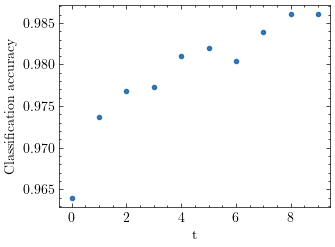

In [275]:
loss_func = nn.CrossEntropyLoss()

results = []

# t_schedule = [0.5 for _ in range(10)] # Constant t, same as regular static skip connections
# t_schedule = [0.7, 0.5, 0.35, 0.2, 0.1, 0.05, 0.03, 0.01, 0.005, 0] # Good for modified ResNet18 [4,4,4,4]
# t_schedule = [0.9, 0.7, 0.5, 0.3, 0.2, 0.1, 0.05, 0.025, 0.01, 0] # Good for ResNet34
t_schedule = [0.5, 0.4, 0.3, 0.2, 0.1, 0.05, 0.025, 0.01, 0.05, 0] # Assuming we don't know a good starting t value, start at 0.5.

n_epochs = len(t_schedule)

n_trials = 5


for trial in tqdm(range(n_trials), desc="Trials", colour="black"):
    # homcnn = HomotopyCNN(in_channels = 1, out_channels = 1, n_layers = 4, kernel_size=[3,3,3,3], in_size = in_size, connections="all", t=t).to(device)
    # homcnn = ResNet(t, BasicBlock, [2, 2, 2, 2], in_channels=1).to(device) # ResNet18
    homcnn = ResNet(t, BasicBlock, [3, 4, 6, 3], in_channels=1).to(device) # ResNet34
    # homcnn = ResNet(t, Bottleneck, [3, 4, 6, 3], in_channels=1).to(device) # ResNet50
    
    homcnn = ResNet(t_schedule[0], BasicBlock, [4, 4, 4, 4], in_channels=1).to(device) # ResNet18
    if use_double_precision:
        homcnn = homcnn.double()
    optim = torch.optim.SGD(homcnn.parameters(), lr=0.01, momentum=0.7)

    accuracy_over_time = []
    
    for epoch in tqdm(range(n_epochs),desc="Epochs", leave=False):
        
        homcnn.update_t( t_schedule[epoch] )
        
        epoch_loss = 0
        for i, (imgs, labels) in enumerate(tqdm(train_loader, leave=False, colour="purple", mininterval=0.5)):
            imgs = imgs.to(device)
            labels = labels.to(device)
    
            predictions = homcnn(imgs)
            loss = loss_func(predictions, labels)
    
            optim.zero_grad()
            loss.backward()
            optim.step()
            epoch_loss += loss.item()
    
        with torch.no_grad():
            correct, total = 0, 0
            for imgs, labels in tqdm(test_loader, desc="Validation", leave=False, colour="gray", mininterval=0.5):
                imgs = imgs.to(device)
                predictions = homcnn(imgs)
                predictions = np.argmax(predictions.to("cpu"), axis=1) # Turn probabilities into prediction by taking highest logit
                correct += sum(predictions == labels).item()
                total += len(labels)
            accuracy = correct/total
            accuracy_over_time.append(accuracy)
            print(f"Validation accuracy:  {accuracy:.5f} ({correct}/{total})")
    results.append(accuracy_over_time)
    print()


fig, ax = plt.subplots()
avg_accuracy = np.asarray(np.mean(np.asarray(results), axis=0))
ax.scatter(range(len(avg_accuracy)), avg_accuracy, alpha=0.8, label="Varying schedule")
ax.set_xlabel("t")
ax.set_ylabel("Classification accuracy")
# ax.legend()
plt.show()


## Plot results

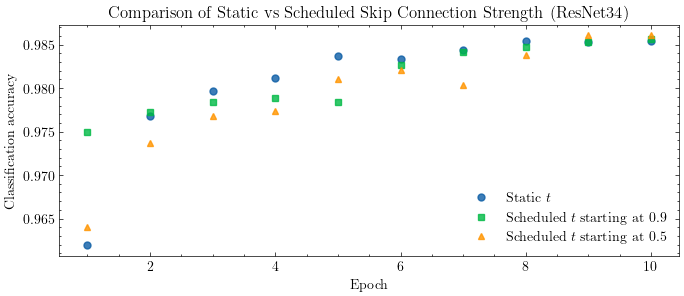

In [291]:
# ResNet34 results

# Static t 
r1 = [[0.969, 0.9803, 0.9832, 0.9825, 0.9873, 0.9865, 0.9855, 0.9875, 0.9844, 0.9856], [0.9542, 0.9779, 0.9784, 0.9829, 0.9822, 0.984, 0.9827, 0.9861, 0.9847, 0.9845], [0.9643, 0.9767, 0.9827, 0.9843, 0.9842, 0.9814, 0.9843, 0.9865, 0.9861, 0.9858], [0.966, 0.9764, 0.9744, 0.9757, 0.9822, 0.981, 0.9859, 0.9849, 0.9872, 0.9854], [0.956, 0.9729, 0.9797, 0.9805, 0.9826, 0.9839, 0.9837, 0.9821, 0.9842, 0.9861]]
x1 = np.asarray(np.mean(np.asarray(r1), axis=0))

# Scheduled t (starting at 0.9. t_schedule = [0.9, 0.7, 0.5, 0.3, 0.2, 0.1, 0.05, 0.025, 0.01, 0])
r2 = [[0.9756, 0.9755, 0.9784, 0.9795, 0.9701, 0.9835, 0.9827, 0.9864, 0.9841, 0.9865], [0.9743, 0.9782, 0.9797, 0.9739, 0.9807, 0.9833, 0.9854, 0.9829, 0.9867, 0.9879], [0.9746, 0.9783, 0.9802, 0.9815, 0.978, 0.9835, 0.9837, 0.9862, 0.9868, 0.9865], [0.9755, 0.9798, 0.9816, 0.9791, 0.9802, 0.984, 0.9827, 0.9844, 0.9874, 0.9828], [0.9747, 0.9745, 0.9724, 0.9802, 0.9832, 0.9793, 0.9863, 0.9837, 0.9817, 0.9846]]
x2 = np.asarray(np.mean(np.asarray(r2), axis=0))

# Scheduled t (starting at 0.5)
r3 = [[0.9666, 0.976, 0.9809, 0.9807, 0.9808, 0.9802, 0.9866, 0.9853, 0.9833, 0.9875], [0.9632, 0.9716, 0.9756, 0.9737, 0.9823, 0.9817, 0.9857, 0.9782, 0.9861, 0.9853], [0.9628, 0.9749, 0.9712, 0.9796, 0.9812, 0.9828, 0.9738, 0.9854, 0.9875, 0.9826], [0.9637, 0.9743, 0.9758, 0.9802, 0.9807, 0.9844, 0.9767, 0.9856, 0.9881, 0.9882], [0.9636, 0.9714, 0.9807, 0.9724, 0.9803, 0.9811, 0.9792, 0.9848, 0.9853, 0.9867]]
x3 = np.asarray(np.mean(np.asarray(r3), axis=0))


fig, ax = plt.subplots(figsize=(8,3))
ax.plot(range(1,len(x1)+1), x1, markersize=5, alpha=0.8, label="Static $t$")
ax.plot(range(1,len(x2)+1), x2, markersize=5, alpha=0.8, label="Scheduled $t$ starting at 0.9")
ax.plot(range(1,len(x3)+1), x3, markersize=5, alpha=0.8, label="Scheduled $t$ starting at 0.5")
ax.set_xlabel("Epoch")
ax.set_ylabel("Classification accuracy")
ax.set_title("Comparison of Static vs Scheduled Skip Connection Strength (ResNet34)")
ax.legend(loc="lower right")
fig.savefig(f"paper images/static_vs_scheduled_t.svg", format="svg", bbox_inches="tight", pad_inches=0)
plt.show()

# Compare Various Linear Networks

Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

1 0.8667


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

2 0.8829


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

3 0.8907


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

4 0.8959


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

5 0.8989


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

6 0.9021


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

7 0.9039


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

8 0.9052


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

9 0.9062


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

10 0.9079


Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

1 0.8667


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

2 0.8812


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

3 0.8907


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

4 0.8955


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

5 0.8988


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

6 0.9025


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

7 0.9029


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

8 0.905


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

9 0.9072


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

10 0.9085


Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

1 0.8683


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

2 0.8841


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

3 0.8896


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

4 0.8949


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

5 0.8989


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

6 0.9023


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

7 0.9034


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

8 0.9057


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

9 0.9059


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

10 0.907


Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

1 0.8682


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

2 0.8821


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

3 0.8892


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

4 0.8958


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

5 0.898


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

6 0.9015


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

7 0.9035


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

8 0.9046


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

9 0.9071


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

10 0.9076


Epochs:   0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

1 0.8652


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

2 0.8808


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

3 0.8893


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

4 0.8951


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

5 0.8991


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

6 0.9018


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

7 0.9036


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

8 0.9055


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

9 0.9064


  0%|          | 0/938 [00:00<?, ?it/s]

Validation:   0%|          | 0/157 [00:00<?, ?it/s]

10 0.9071


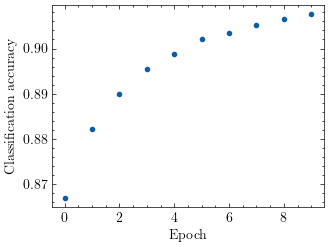

In [285]:
# Perceptron vs CNN

loss_func = nn.CrossEntropyLoss()

n_epochs = 10

n_trials = 5

results = []

for trial in range(n_trials):

    # # Single-layer perceptron
    homcnn = nn.Sequential(nn.Flatten(), nn.Linear(in_size**2, 10)).to(device)

    # # Shallow Network
    # homcnn = HomotopyCNN(in_channels = 1, out_channels = 1, n_layers = 3, kernel_size=[3,3,3], in_size = in_size, connections="all", t=t).to(device)

    # # Deeper network (akin to ResNet18)
    # homcnn = HomotopyCNN(in_channels = 1, out_channels = 64, n_layers = 3,
    #                      kernel_size=[3 for _ in range(17)], 
    #                      in_size = in_size,
    #                      connections=[[0,3], [2,5],[4,7],[6,9],[8,11],[10,13],[12,15],[14,17]],
    #                      padding="same",
    #                      t=t).to(device)
    # homcnn = HomotopyCNN(in_channels = 1, out_channels = 1, n_layers = 4, kernel_size=[3,3,3,3], in_size = in_size, connections="all", t=t).to(device)
    
    # # ResNet18, linearized
    # homcnn = ResNet(0.5, BasicBlock, [2, 2, 2, 2], in_channels=1, linear=True).to(device) # ResNet18

    # # ResNet34, linearized
    # homcnn = ResNet(0.5, BasicBlock, [3, 4, 6, 3], in_channels=1, linear=True).to(device) # ResNet34
    
    if use_double_precision:
        homcnn = homcnn.double()
        
    optim = torch.optim.SGD(homcnn.parameters(), lr=0.01, momentum=0.7)

    accuracy_over_time = []
    for epoch in tqdm(range(n_epochs),desc="Epochs", leave=False):
        
        epoch_loss = 0
        for i, (imgs, labels) in enumerate(tqdm(train_loader, leave=False, colour="purple", mininterval=0.5)):
            imgs = imgs.to(device)
            labels = labels.to(device)
    
            predictions = homcnn(imgs)
            loss = loss_func(predictions, labels)
    
            optim.zero_grad()
            loss.backward()
            optim.step()
            epoch_loss += loss.item()
    
        with torch.no_grad():
            correct, total = 0, 0
            for imgs, labels in tqdm(test_loader, desc="Validation", leave=False, colour="gray", mininterval=0.5):
                imgs = imgs.to(device)
                predictions = homcnn(imgs)
                predictions = np.argmax(predictions.to("cpu"), axis=1) # Turn probabilities into prediction by taking highest logit
                correct += sum(predictions == labels).item()
                total += len(labels)
            accuracy = correct/total
            accuracy_over_time.append(accuracy)
            print(epoch+1, accuracy)
            # print(f"Validation accuracy:  {accuracy:.5f} ({correct}/{total})")
    results.append(accuracy_over_time)


fig, ax = plt.subplots()
avg_accuracy = np.asarray(np.mean(np.asarray(results), axis=0))
ax.plot(range(len(avg_accuracy)), avg_accuracy, label="Single-layer perceptron")
ax.set_xlabel("Epoch")
ax.set_ylabel("Classification accuracy")
# ax.legend()
plt.show()


## Plot results

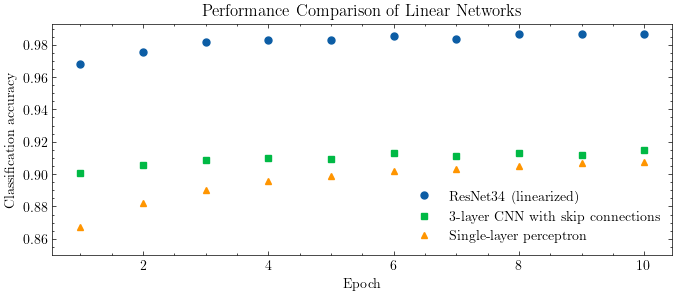

In [290]:
# ResNet34
r1 = [[0.9695, 0.9783, 0.9788, 0.9829, 0.9875, 0.985, 0.9817, 0.9855, 0.9854, 0.985], [0.9672, 0.9773, 0.9796, 0.9825, 0.9757, 0.9876, 0.9865, 0.9865, 0.987, 0.9885], [0.9691, 0.9699, 0.9841, 0.9838, 0.9829, 0.9853, 0.988, 0.9863, 0.9857, 0.9877], [0.9677, 0.9781, 0.9829, 0.984, 0.984, 0.9831, 0.9821, 0.9881, 0.9871, 0.9861], [0.9672, 0.9728, 0.9824, 0.98, 0.9853, 0.9856, 0.9807, 0.9857, 0.9878, 0.9868]]
x1 = np.asarray(np.mean(np.asarray(r1), axis=0))

# Shallow network
r2 = [[0.9045, 0.9064, 0.909, 0.9109, 0.9064, 0.9109, 0.9102, 0.9155, 0.9145, 0.9152], [0.9003, 0.9043, 0.9084, 0.9081, 0.9089, 0.9126, 0.9079, 0.9131, 0.9103, 0.9136], [0.9044, 0.9067, 0.9097, 0.9119, 0.9131, 0.9142, 0.9139, 0.9125, 0.913, 0.9164], [0.8997, 0.9077, 0.9071, 0.9088, 0.9082, 0.9089, 0.9136, 0.9104, 0.9103, 0.9141], [0.8943, 0.9042, 0.9089, 0.9089, 0.9096, 0.9178, 0.9096, 0.9148, 0.9115, 0.9157]]
x2 = np.asarray(np.mean(np.asarray(r2), axis=0))

# Single-layer perceptron
r3 = [[0.8667, 0.8829, 0.8907, 0.8959, 0.8989, 0.9021, 0.9039, 0.9052, 0.9062, 0.9079], [0.8667, 0.8812, 0.8907, 0.8955, 0.8988, 0.9025, 0.9029, 0.905, 0.9072, 0.9085], [0.8683, 0.8841, 0.8896, 0.8949, 0.8989, 0.9023, 0.9034, 0.9057, 0.9059, 0.907], [0.8682, 0.8821, 0.8892, 0.8958, 0.898, 0.9015, 0.9035, 0.9046, 0.9071, 0.9076], [0.8652, 0.8808, 0.8893, 0.8951, 0.8991, 0.9018, 0.9036, 0.9055, 0.9064, 0.9071]]
x3 = np.asarray(np.mean(np.asarray(r3), axis=0))


fig, ax = plt.subplots(figsize=(8,3))
avg_accuracy = np.asarray(np.mean(np.asarray(results), axis=0))
ax.plot(range(1,len(x1)+1), x1, markersize=5, label="ResNet34 (linearized)")
ax.plot(range(1,len(x2)+1), x2, markersize=5, label="3-layer CNN with skip connections")
ax.plot(range(1,len(x3)+1), x3, markersize=5, label="Single-layer perceptron")
ax.set_ylim([0.85, ax.get_ylim()[1]])
ax.set_xlabel("Epoch")
ax.set_ylabel("Classification accuracy")
ax.set_title("Performance Comparison of Linear Networks")
ax.legend()
fig.savefig(f"paper images/linear_performance_comparison.svg", format="svg", bbox_inches="tight", pad_inches=0)
plt.show()

# Compare prediction times of various networks

### Compare ResNet with/without skip connections

In [310]:
import time

def track_prediction_time(model, n_epochs):
    """
    Given model, returns list of prediction time taken for each batch in train_loader.
    """
    time_list = []
    with torch.no_grad():
        model.eval()
        for epoch in tqdm(range(n_epochs),desc="Epochs", leave=False):
            for i, (imgs, labels) in enumerate(train_loader):
                imgs = imgs.to(device)
                labels = labels.to(device)
    
                start = time.time()
                predictions = model(imgs)
                end = time.time()
                time_list.append(end-start)
                
    return time_list

n_epochs = 5

# ResNet34 (no skips)
model = ResNet(0.5, BasicBlockNoSkip, [3, 4, 6, 3], in_channels=1).to(device) # ResNet34 (no skip connections)
if use_double_precision:
    model = model.double()
time_list = track_prediction_time(model, n_epochs=n_epochs)
print(f"Mean time for single ResNet34 prediction (no skips)   across {n_epochs} epochs with batch size {batch_size}: {np.mean(time_list)/batch_size} seconds")

# ResNet34 (with skips)
model = ResNet(0.5, BasicBlock, [3, 4, 6, 3], in_channels=1).to(device) # ResNet34 (no skip connections)
if use_double_precision:
    model = model.double()
time_list = track_prediction_time(model, n_epochs=n_epochs)
print(f"Mean time for single ResNet34 prediction (with skips) across {n_epochs} epochs with batch size {batch_size}: {np.mean(time_list)/batch_size} seconds")

Epochs:   0%|          | 0/5 [00:00<?, ?it/s]

Mean time for single ResNet34 prediction (no skips)   across 5 epochs with batch size 64: 8.31294105823106e-05 seconds


Epochs:   0%|          | 0/5 [00:00<?, ?it/s]

Mean time for single ResNet34 prediction (with skips) across 5 epochs with batch size 64: 0.00010682757951811687 seconds


### Compare 6-layer CNN with/without skip connections

In [311]:
# 6-layer CNN (no skips)
model = HomotopyCNN(in_channels = 1, out_channels = 1, n_layers = 6, kernel_size=[3,3,3,3,3,3], in_size = in_size, connections="none", t=0.5).to(device)
if use_double_precision:
    model = model.double()
time_list = track_prediction_time(model, n_epochs=n_epochs)
print(f"Mean time for single ResNet34 prediction (no skips)   across {n_epochs} epochs with batch size {batch_size}: {np.mean(time_list)/batch_size} seconds")

# 6-layer CNN (with skips)
model = HomotopyCNN(in_channels = 1, out_channels = 1, n_layers = 6, kernel_size=[3,3,3,3,3,3], in_size = in_size, connections="all", t=t).to(device)
if use_double_precision:
    model = model.double()
time_list = track_prediction_time(model, n_epochs=n_epochs)
print(f"Mean time for single ResNet34 prediction (with skips) across {n_epochs} epochs with batch size {batch_size}: {np.mean(time_list)/batch_size} seconds")

Epochs:   0%|          | 0/5 [00:00<?, ?it/s]

Mean time for single ResNet34 prediction (no skips)   across 5 epochs with batch size 64: 1.6435406514322327e-05 seconds


Epochs:   0%|          | 0/5 [00:00<?, ?it/s]

Mean time for single ResNet34 prediction (with skips) across 5 epochs with batch size 64: 3.0719499185141216e-05 seconds


### Compare single-layer perceptron, 3-layer linear CNN, and linearized ResNet34

In [312]:
# Single-layer perceptron
model = nn.Sequential(nn.Flatten(), nn.Linear(in_size**2, 10)).to(device)
if use_double_precision:
    model = model.double()
time_list = track_prediction_time(model, n_epochs=n_epochs)
print(f"Mean time for single perceptron      prediction across {n_epochs} epochs with batch size {batch_size}: {np.mean(time_list)/batch_size} seconds")


# Shallow Network
model = HomotopyCNN(in_channels = 1, out_channels = 1, n_layers = 3, kernel_size=[3,3,3], in_size = in_size, connections="all", t=t).to(device)
if use_double_precision:
    model = model.double()
time_list = track_prediction_time(model, n_epochs=n_epochs)
print(f"Mean time for single shallow CNN     prediction across {n_epochs} epochs with batch size {batch_size}: {np.mean(time_list)/batch_size} seconds")


# ResNet34, linearized
model = ResNet(0.5, BasicBlock, [3, 4, 6, 3], in_channels=1, linear=True).to(device) # ResNet34
if use_double_precision:
    model = model.double()
time_list = track_prediction_time(model, n_epochs=n_epochs)
print(f"Mean time for single linear ResNet34 prediction across {n_epochs} epochs with batch size {batch_size}: {np.mean(time_list)/batch_size} seconds")

Epochs:   0%|          | 0/5 [00:00<?, ?it/s]

Mean time for single perceptron      prediction across 5 epochs with batch size 64: 2.0613365653735488e-06 seconds


Epochs:   0%|          | 0/5 [00:00<?, ?it/s]

Mean time for single shallow CNN     prediction across 5 epochs with batch size 64: 1.2054913905637859e-05 seconds


Epochs:   0%|          | 0/5 [00:00<?, ?it/s]

Mean time for single linear ResNet34 prediction across 5 epochs with batch size 64: 0.00010491117183714788 seconds


# Misc (unused in paper)

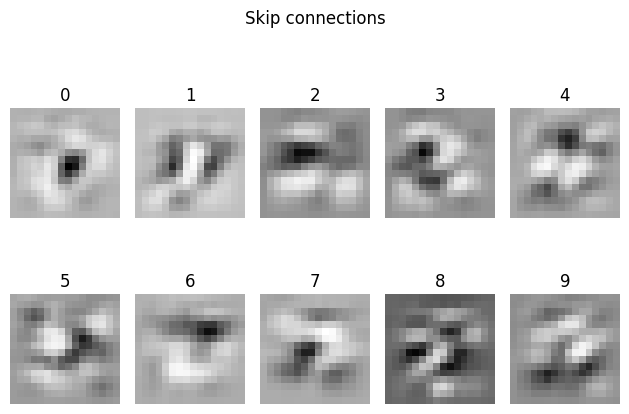

In [ ]:
W, B, W_latent, B_latent = homcnn_to_matrices(homcnn)

fig, ax = plt.subplots(2,5)

vmax = max([max(W[i]+B[i]) for i in range(10)])
vmin = min([min(W[i]+B[i]) for i in range(10)])
for i in range(10):
    row, col = int(np.floor(i/5)), i % 5
    img = W[i].reshape([in_size,in_size])+B[i]
    ax[row][col].imshow(img, vmax=(vmax+9*img.max())/10, vmin=(vmin+9*img.min())/10, cmap="Greys_r") # 9/10 weight towards img bounds, 1/10 weight towards overall bounds
    ax[row][col].set_title(i)
    ax[row][col].axis('off')
fig.suptitle("Skip connections")
fig.tight_layout()
plt.show()

In [ ]:
torch.save(cnn.state_dict, f"2024-02-21_cnn_weights_{in_size}x{in_size}.pt")
# state_dict = torch.load("2024-02-15_cnn_weights.pt", map_location=torch.device(device))()
# cnn.load_state_dict(state_dict)

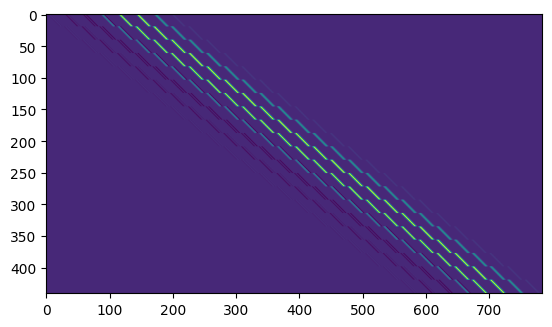

In [ ]:
plt.imshow(W_latent) # plt.imshow(np.linalg.pinv(W_latent))